In [3]:
import os
import csv
import optuna
import numpy as np
import pandas as pd
from tensorflow import keras
from tensorflow.keras.optimizers import Adam, RMSprop, SGD
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Input, LSTM, Dense, Activation, Dropout
from pandas import DataFrame
from pandas import Series
from pandas import concat
from pandas import read_csv
from datetime import datetime
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from math import sqrt
from matplotlib import pyplot as plt
from matplotlib.patches import Patch
from numpy import array
import keras.backend as K
import itertools
#!pip install pydot

# date-time parsing function for loading the dataset
def parser(x):
    return datetime.strptime('190'+x, '%Y-%m')
    
def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))
    
def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
    
# convert time series into a supervised learning problem
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
# convert time series into a supervised learning problem
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):

    n_vars = 1 if type(data) is list else data.shape[1]
    cols, names = list(), list()
    df = DataFrame(data)
    # input sequence (t-n, ... t-1)
    for i in range(n_in, 0, -1):
    	cols.append(df.shift(i))
    	names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
    # forecast sequence (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(df[0].shift(-i)) # df[0] for specific humidity
        if i == 0:
            names += [('var%d(t)' % (1))] # % (1) for specific humidity
        else:            
            names += [('var%d(t+%d)' % (1, i))] # % (1) for specific humidity
    
    # put it all together
    agg = concat(cols, axis=1)

    if dropnan:
        #Drop rows containing NaN
        agg.dropna(inplace=True)

    agg.columns = names

    return agg
     
# create a differenced series
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def difference(dataset, interval=1):
    diff = list()
    for i in range(interval, len(dataset)):
        value = dataset[i] - dataset[i - interval]
        diff.append(value)
    return Series(diff)
     
# transform series into training sets for supervised learning
def prepare_training_data(data, n_lag, n_seq, n_time_steps):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)


    diff_values = []
    
    for ws in range(84):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)
    
    # rescale values to 0, 1
    scaler_all_features =  MinMaxScaler(feature_range=(0, 1))
    scaler =  MinMaxScaler(feature_range=(0, 1))
    train_scaled_values = scaler_all_features.fit_transform(diff_values)
    response_train_values = []
    for i in range(len(diff_values)):
        response_train_values.append(diff_values[i][0]) # Uses first column (specific_humidity) as response variable
    response_train_values = np.array(response_train_values)
    response_train_values = response_train_values.reshape(len(response_train_values), 1)

    # Fit the scaler for just the response variable for use later when forecasting
    response_scaled_values = scaler.fit_transform(response_train_values) 
    scaled_values = scaler_all_features.transform(diff_values)

    train = []

    # Transform each weather station as a separate "batch"
    for ws in range(84):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        train.append([supervised_values])
    
    return scaler, scaler_all_features, train

# transform series into testing and validation sets for supervised learning
def prepare_testing_and_validation_data(data, n_lag, n_seq, n_time_steps, scaler_all_features):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)


    diff_values = []
    
    for ws in range(21):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)

    # rescale values to 0, 1
    scaled_values = scaler_all_features.transform(diff_values)

    validation = []
    test = []

    # Transform each weather station as a separate "batch"
    for ws in range(21):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        # training/test/validation split is 80%/10%/10%
        if ws < 11:
            test.append([supervised_values])
        else:
            validation.append([supervised_values])
    
    return validation, test
    
def plot_kfold(cv, X, y, ax, n_splits, xlim_max=105):
    
    #Plots the indices for a cross-validation object.
    #Taken from https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
    #Parameters:
    #cv: Cross-validation object
    #X: Feature set
    #y: Target variable
    #ax: Matplotlib axis object
    #n_splits: Number of folds in the cross-validation
    #xlim_max: Maximum limit for the x-axis
        
    # Set color map for the plot
    cmap_cv = plt.cm.coolwarm
    cv_split = cv.split(X=X, y=y)
        
    for i_split, (train_idx, test_idx) in enumerate(cv_split):
        # Create an array of NaNs and fill in training/testing indices
        indices = np.full(len(X), np.nan)
        indices[test_idx], indices[train_idx] = 1, 0
            
        # Plot the training and testing indices
        ax_x = range(len(indices))
        ax_y = [i_split + 0.5] * len(indices)
        ax.scatter(ax_x, ax_y, c=indices, marker="_", 
                   lw=10, cmap=cmap_cv, vmin=-0.2, vmax=1.2)
    
        # Set y-ticks and labels
        y_ticks = np.arange(n_splits) + 0.5
        ax.set(yticks=y_ticks, yticklabels=range(n_splits),
               xlabel="Weather Station index (file_id)", ylabel="Fold",
               ylim=[n_splits, -0.2], xlim=[0, xlim_max])
    
        # Set plot title and create legend
        ax.set_title("KFold", fontsize=14)
        legend_patches = [Patch(color=cmap_cv(0.8), label="Testing set"), 
                          Patch(color=cmap_cv(0.02), label="Training set")]
        ax.legend(handles=legend_patches, loc=(1.03, 0.8))
    
#Main

#Configure
n_seq = 3
if n_seq > 46:
    n_lag = 179 - n_seq + 46
else:
    n_lag = 179
n_time_steps = 227
n_test = 1

print("Model Parameters:")
print("n_lag (number of input time steps): "+str(n_lag))
print("n_seq (number of output/future prediction time steps): "+str(n_seq))

# Create 2D array with file_ids to use for sample creation
array = np.array([
    6501, 6541, 6640, 6668, 6678, 
    6687, 6697, 6714, 6744, 6772, 
    6783, 6840, 6844, 6854, 6870, 
    6891, 6895, 6899, 6901, 6909, 
    6929, 6950, 6963, 6969, 6994, 
    7032, 7057, 7094, 7095, 7100, 
    7108, 7116, 7119, 7131, 7139, 
    7152, 7155, 7156, 7182, 7193, 
    7202, 7239, 7280, 7286, 7287, 
    7311, 7321, 7329, 7347, 7350, 
    7354, 7357, 7361, 7414, 7423, 
    7424, 7432, 7463, 7482, 7489, 
    7528, 7531, 7534, 7538, 7549, 
    7553, 7555, 7562, 7571, 7573, 
    7574, 7575, 7585, 7599, 7603, 
    7606, 7622, 7652, 7671, 7704, 
    7786, 7805, 7816, 7838, 7861, 
    7862, 7863, 7870, 7892, 7907, 
    7938, 7962, 7979, 7987, 7999, 
    8000, 8034, 8083, 8120, 8133, 
    8184, 8186, 8247, 8248, 9858])
    
#Create arrays holding the 5-fold cross-validation indices gathered for consistency across models
train_array = []
test_array = []
    
train_array.append([1, 2, 3, 5, 6, 7, 8, 9, 11, 13, 14, 15, 16, 17, 19, 20, 21, 22, 
                        23, 24, 25, 27, 28, 29, 32, 34, 35, 36, 37, 38, 39, 40, 41, 42, 
                        43, 44, 46, 48, 49, 50, 51, 52, 54, 55, 56, 57, 58, 59, 60, 61, 
                        62, 63, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 78, 79, 81, 
                        82, 83, 84, 85, 86, 87, 88, 90, 91, 92, 93, 95, 97, 98, 100, 101, 102, 103])
test_array.append([0, 4, 10, 12, 18, 26, 30, 31, 33, 45, 47, 53, 64, 65, 77, 80, 89, 94, 96, 99, 104])
    
train_array.append([0, 1, 2, 3, 4, 6, 7, 8, 10, 12, 13, 14, 17, 18, 19, 20, 21, 23, 
                        24, 25, 26, 27, 29, 30, 31, 32, 33, 34, 36, 37, 38, 41, 43, 45, 
                        46, 47, 48, 49, 50, 51, 52, 53, 54, 57, 58, 59, 60, 61, 63, 64, 
                        65, 66, 67, 68, 69, 70, 71, 73, 74, 75, 77, 80, 81, 82, 83, 84, 
                        86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 104])
test_array.append([5, 9, 11, 15, 16, 22, 28, 35, 39, 40, 42, 44, 55, 56, 62, 72, 76, 78, 79, 85, 103])
    
train_array.append([0, 1, 2, 4, 5, 9, 10, 11, 12, 14, 15, 16, 18, 20, 21, 22, 23, 26, 
                    28, 29, 30, 31, 32, 33, 35, 36, 37, 39, 40, 41, 42, 44, 45, 46, 47, 
                    48, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 
                    70, 71, 72, 74, 75, 76, 77, 78, 79, 80, 82, 83, 85, 86, 87, 88, 89, 
                    90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104])
test_array.append([3, 6, 7, 8, 13, 17, 19, 24, 25, 27, 34, 38, 43, 49, 66, 67, 68, 69, 73, 81, 84])
    
train_array.append([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 
                        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 33, 34, 
                        35, 37, 38, 39, 40, 42, 43, 44, 45, 47, 49, 51, 52, 53, 55, 56, 
                        60, 62, 64, 65, 66, 67, 68, 69, 71, 72, 73, 74, 76, 77, 78, 79, 
                        80, 81, 82, 84, 85, 86, 87, 88, 89, 92, 93, 94, 95, 96, 99, 102, 103, 104])
test_array.append([32, 36, 41, 46, 48, 50, 54, 57, 58, 59, 61, 63, 70, 75, 83, 90, 91, 97, 98, 100, 101])
    
train_array.append([0, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 15, 16, 17, 18, 19, 22,
                        24, 25, 26, 27, 28, 30, 31, 32, 33, 34, 35, 36, 38, 39, 40, 41, 
                        42, 43, 44, 45, 46, 47, 48, 49, 50, 53, 54, 55, 56, 57, 58, 59, 
                        61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 72, 73, 75, 76, 77, 78, 
                        79, 80, 81, 83, 84, 85, 89, 90, 91, 94, 96, 97, 98, 99, 100, 101, 103, 104])
test_array.append([1, 2, 14, 20, 21, 23, 29, 37, 51, 52, 60, 71, 74, 82, 86, 87, 88, 92, 93, 95, 102])
    
# Equations for three Principal Components from PCA using response variables combined with other predictors
#PC1=-0.0002714X1+0.02612X2+0.03858X3-0.007658X4+0.001592X5-0.02087X6+0.8564X7-0.1468X8+0.01192X9-0.0001049X10+0.01913X11+0.02076X12
#PC2=0.0003944X1+0.002204X2+0.01052X3+0.3248X4-0.0009976X5-0.04421X6+2.3406X7+0.06103X8+0.08841X9+0.00009018X10+0.05678X11-0.002022X12
#PC3=-0.00007998X1-0.0006124X2-0.001063X3-0.01855X4+0.00001956X5+0.01170X6+0.6076X7+0.4664X8-0.002995X9+0.008185X10+0.8815X11-0.0004730X12
    
# Equations for three Principal Components from PCA omitting both response variables,
#PC-1=-0.0004514X1+0.03194X2-0.04343X3+0.002243X4-0.02252X5+0.9877X6-0.2265X7+0.006144X8-0.0001488X9+0.02943X10
#PC-2=0.0001702X1+0.005484X2+0.2057X3-0.0003188X4-0.02584X5+1.6963X6-0.05890X7+0.05809X8+1.9748X9+0.03686X10
#PC-3=-0.00006323X1-0.001180X2-0.02384X3-0.00002833X4+0.01170X5+0.5204X6+0.4791X7-0.004318X8+0.008271X9+0.8765X10
    
# Get the current working directory 
current_directory = os.getcwd() 
    
# Print the current working directory 
print(current_directory)
    
# Define the directory containing the files 
path = current_directory+"\\Modeling\\"
print(path)
    
filename = path + 'Final_Monthly_Dataset.csv'
    
# load dataset
df = read_csv(filename, header=0, parse_dates=[0], index_col=0, date_format='%Y-%m')

# Swap columns 'temperatures' and 'specific_humidity' directly
df['A'] = df['temperatures']
df['temperatures'] = df['specific_humidity']
df['specific_humidity'] = df['A']
df = df.drop(columns=['A'])
# Rename columns
df = df.rename(columns={'temperatures': 'specific_humidity', 'specific_humidity': 'temperatures'})

print(df)
    
df = df.rename(columns={'Unnamed: 0' : 'indices'})

#Remove unused columns
df = df.drop(['Day', 'vapor_pressure'], axis=1)
    
# Round numbers in columns to reasonable precision,
df['temperatures'] = np.round(df['temperatures'], 2)
df['slp'] = np.round(df['slp'], 2)
df['wet_bulb_temperature'] = np.round(df['wet_bulb_temperature'], 2)
df['specific_humidity'] = np.round(df['specific_humidity'], 2)
df['GHI'] = np.round(df['GHI'], 2)
df['PRCP'] = np.round(df['PRCP'], 2)
df['SNDP'] = np.round(df['SNDP'], 2)
df['solar_activity'] = np.round(df['solar_activity'], 2)
df['ONI'] = np.round(df['ONI'], 2)
df['water'] = np.round(df['water'], 0)
df['region'] = np.round(df['region'], 0)
    
df_trimmed = df[df['file_id'] != 7533] # Remove file_id 7533 so there are 105 weather stations for 5-fold CV
df_trimmed = df_trimmed.drop(['Year', 'Month', 'date', 'latitude', 'longitude', 'elevation'], axis=1)

#Test model and accuracy when solar activity is removed as a predictor
df_trimmed = df_trimmed.drop(['ONI'], axis=1)

n_vars = df_trimmed.shape[1]-1
    
X = []
y = []
    
for i in array:
    add_to_X = [] # create list to store each column to add to X
    new_df = df_trimmed[df_trimmed['file_id'] == i].drop(['file_id'], axis=1)
    #new_df = new_df.iloc[:180, :]
    add_to_y = []
    for j in range(new_df.shape[0]):
        add_to_y.append(new_df['specific_humidity'].iloc[j])
    y.append(add_to_y)
    #new_df = new_df.drop(['specific_humidity'], axis=1)
    columns_list = new_df.columns.tolist()
    for j in range(new_df.shape[0]):
        l=0
        new_row = []
        for m in columns_list:
            new_row.append(new_df.iloc[j, l])
            l += 1
        add_to_X.append(new_row)
    X.append(add_to_X)
    
#Perform k-fold cross-validation
#Taken from: https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
#k = 5  # Number of folds
#kf = KFold(n_splits=k, shuffle=True, random_state=42)
    
#for i, (train_index, test_index) in enumerate(kf.split(X)):
#    print(f"Fold {i}:")
#    print(f"  Training dataset index: {train_index}")
#    print(f"  Test dataset index: {test_index}")
    
#for train_indices, test_indices in kf.split(X):
#    print('Train: %s | test: %s' % (train_indices, test_indices))
    
# Create figure and axis
#fig, ax = plt.subplots(figsize=(6, 3))
#plot_kfold(kf, X, y, ax, k)
#plt.tight_layout()
#fig.subplots_adjust(right=0.6)
    
#Create train and test sets for each cross-validation split
train_X = []
train_y = []
val_X = []
val_y = []
for i in range(5):
    print(f"Fold {i+1}")
    #Add each corresponding sample for each entry of train index 
    train_X_rows = [] # Stores all the samples for one fold of train_X
    train_y_rows = [] # Stores all the samples for one fold of train_y
    for j in train_array[i]:
        train_X_rows.append(X[j])
        train_y_rows.append(y[j])
    # Stores one fold of train dataset
    train_X.append(train_X_rows)
    train_y.append(train_y_rows)
    #Add each corresponding sample for each entry of the validation index 
    val_X_rows = [] # Stores all the samples for one fold of val_X
    val_y_rows = [] # Stores all the samples for one fold of val_y
    for j in test_array[i]: 
            val_X_rows.append(X[j])
            val_y_rows.append(y[j])
    # Stores one fold of validation dataset
    val_X.append(val_X_rows)
    val_y.append(val_y_rows) 
    
#Convert 3D arrays to DataFrames
df_X = []
df_y = []
val_df_X = []
val_df_y = []
dataset = []
dataset_test = []
scaler = []
scaler_all_features = []
train = []
test = []
validation = []

for i in range(5):
    dataset_scaling = [] # Holds all 84 weather station rows to train the scaling function
    dataset_testing = [] # Holds remaining 21 weather station rows for testing and validation
    print("Fold "+str(i+1)+":")
    #Transform train_X to the correct format
    df1 = []
    dataset_df = [] # captures each weather station's dataset as values for training scaler mapping
    df_X.append(pd.DataFrame(train_X[i]))
    X_t = df_X[i].transpose()
    for k in range(84):
        X = np.array(X_t.iloc[:, k])
        df = pd.DataFrame()
        for j in range(n_time_steps):
            new_row = pd.DataFrame(X[j]).transpose()
            new_row.columns = new_df.columns
            # Add the new row
            df = pd.concat([df, new_row], ignore_index=True)
        df.columns = new_df.columns
        df1.append(df)
        dataset_df.append(df.values)
        dataset_scaling.append(df.values)
    df_X[i] = df1
    dataset.append(dataset_df)

    #print(len(dataset))
    #print(len(dataset[0]))
    #print(len(dataset_scaling))
    #print(len(dataset_scaling[:][0]))
    #print("Stop")
    
    #Transform train_y to the correct format
    df2 = []
    df_y.append(pd.DataFrame(train_y[i]))
    y_t = df_y[i].transpose()
    
    for j in range(84):
        y = np.array(y_t.iloc[:, j])
        y = pd.DataFrame(y)
        y.columns = ['specific_humidity']
        df2.append(y)
    df_y[i] = df2

    #Transform val_X to the correct format
    df3 = []
    dataset_vl_df = [] # captures each weather station's dataset as values for training scaler mapping
    val_df_X.append(pd.DataFrame(val_X[i]))
    val_X_t = val_df_X[i].transpose()
    for k in range(21):
        vl_X = np.array(val_X_t.iloc[:, k])
        vl_df = pd.DataFrame()
        for j in range(n_time_steps):
            new1_row = pd.DataFrame(vl_X[j]).transpose()
            new1_row.columns = new_df.columns
            # Add the new row
            vl_df = pd.concat([vl_df, new1_row], ignore_index=True)
        vl_df.columns = new_df.columns
        df3.append(vl_df)
        dataset_vl_df.append(vl_df.values)
        dataset_testing.append(vl_df.values)
    val_df_X[i] = df3
    dataset_test.append(dataset_vl_df)

    #Transform val_y to the correct format
    df4 = []
    val_df_y.append(pd.DataFrame(train_y[i]))
    val_y_t = val_df_y[i].transpose()
    
    for j in range(21):
        v_y = np.array(val_y_t.iloc[:, j])
        v_y = pd.DataFrame(v_y)
        v_y.columns = ['specific_humidity']
        df4.append(v_y)
    val_df_y[i] = df4
    
    scaler.append(MinMaxScaler(feature_range=(0, 1)))
    scaler_all_features.append(MinMaxScaler(feature_range=(0, 1)))
    train.append([1])
    test.append([1])
    validation.append([1])
    
    # prepare data
    scaler[i], scaler_all_features[i], train[i] = prepare_training_data(dataset_scaling, n_lag, n_seq, n_time_steps)

    validation[i], test[i] = prepare_testing_and_validation_data(dataset_testing, n_lag, n_seq, n_time_steps, scaler_all_features[i])

    #Reshape dimensionality
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]
    print(np.array(train1).shape)
    print(np.array(test1).shape)
    print(np.array(validation1).shape)
    train2 = []
    test2 = []
    validation2 = []

    for k in range(84):
        train2.append(train1[k][0])
        
    for k in range(11):
        test2.append(test1[k][0])

    for k in range(10):
        validation2.append(validation1[k][0])

    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2

    #Reshape dimensionality (again)
    dim_size = n_seq + n_vars*n_lag
    train1 = np.array(train[i]).reshape(84, dim_size)
    test1 = np.array(test[i]).reshape(11, dim_size)
    validation1 = np.array(validation[i]).reshape(10, dim_size)
    train2 = pd.DataFrame(train1).values
    test2 = pd.DataFrame(test1).values
    validation2 = pd.DataFrame(validation1).values
    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    print(train2)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2
    
    #X_train = train1[:][:-n_seq]
    #y_train = train1[:][-n_seq:]
    #X_test = test1[:][:-n_seq]
    #y_test = test1[:][-n_seq:]

print("Finished")

Model Parameters:
n_lag (number of input time steps): 179
n_seq (number of output/future prediction time steps): 3
C:\Users\User
C:\Users\User\Modeling\
             date  file_id  specific_humidity          slp  vapor_pressure  \
0      2006-01-31     6501           5.386935  1018.534543        8.674922   
1      2006-02-28     6501           4.299929  1021.230347        6.942276   
2      2006-03-31     6501           6.505135  1018.968548       10.468176   
3      2006-04-30     6501          10.211263  1014.686944       16.358802   
4      2006-05-31     6501          11.737971  1014.236828       18.798749   
...           ...      ...                ...          ...             ...   
24057  2024-07-31     9858          15.211417  1013.969355       23.769169   
24058  2024-08-31     9858          15.149811  1015.112097       23.699154   
24059  2024-09-30     9858          10.720199  1014.393750       16.790240   
24060  2024-10-31     9858           6.989922  1018.230376       10

In [2]:
print(n_seq)
print(n_lag)
print(np.array(train[1]).shape)
print(np.array(test[1]).shape)

3
179
(84, 1972)
(11, 1972)


[I 2025-05-19 14:55:21,155] A new study created in memory with name: no-name-27ac1568-afbe-4962-a71f-3db67f969df5
[I 2025-05-19 14:58:16,215] Trial 0 finished with value: 0.06490702107548714 and parameters: {'lr': 0.005836638802878331, 'optimizer': 'Adam', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.3150380430552192}. Best is trial 0 with value: 0.06490702107548714.


Cross Validation Accuracies:
[0.05430511012673378, 0.07022801041603088, 0.06326353549957275, 0.0728968158364296, 0.06384163349866867]
Mean Cross Validation Accuracy:
0.06490702107548714
Standard Deviation of Cross Validation Accuracy:
0.00645579366424513


[I 2025-05-19 14:59:48,719] Trial 1 finished with value: 0.09785952195525169 and parameters: {'lr': 0.04602103335142337, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.339439245820761}. Best is trial 0 with value: 0.06490702107548714.


Cross Validation Accuracies:
[0.04355248808860779, 0.10270585864782333, 0.14403754472732544, 0.1409606784582138, 0.0580410398542881]
Mean Cross Validation Accuracy:
0.09785952195525169
Standard Deviation of Cross Validation Accuracy:
0.04134820891546894


[I 2025-05-19 15:02:27,712] Trial 2 finished with value: 19.468121910095213 and parameters: {'lr': 0.2180818848903835, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.26033996944931126}. Best is trial 0 with value: 0.06490702107548714.


Cross Validation Accuracies:
[18.905750274658203, 10.747099876403809, 20.328041076660156, 27.594881057739258, 19.76483726501465]
Mean Cross Validation Accuracy:
19.468121910095213
Standard Deviation of Cross Validation Accuracy:
5.352461160758889


[I 2025-05-19 15:08:25,812] Trial 3 finished with value: 0.04932612180709839 and parameters: {'lr': 0.011253011408063264, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.3612770660165102}. Best is trial 3 with value: 0.04932612180709839.


Cross Validation Accuracies:
[0.03941076248884201, 0.04572594538331032, 0.07158040255308151, 0.04063243791460991, 0.04928106069564819]
Mean Cross Validation Accuracy:
0.04932612180709839
Standard Deviation of Cross Validation Accuracy:
0.011679989746055833


[I 2025-05-19 15:12:06,431] Trial 4 finished with value: 0.04637837037444115 and parameters: {'lr': 0.009415092927485208, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.4140752909940455}. Best is trial 4 with value: 0.04637837037444115.


Cross Validation Accuracies:
[0.03915844485163689, 0.03724232688546181, 0.06429615616798401, 0.04524978995323181, 0.04594513401389122]
Mean Cross Validation Accuracy:
0.04637837037444115
Standard Deviation of Cross Validation Accuracy:
0.009571865549012775


[I 2025-05-19 15:18:12,688] Trial 5 finished with value: 17.157458877563478 and parameters: {'lr': 0.16637906833058996, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.45939667789556793}. Best is trial 4 with value: 0.04637837037444115.


Cross Validation Accuracies:
[18.346059799194336, 15.49770736694336, 12.904668807983398, 18.38814926147461, 20.65070915222168]
Mean Cross Validation Accuracy:
17.157458877563478
Standard Deviation of Cross Validation Accuracy:
2.6822068117979776


[I 2025-05-19 15:20:41,170] Trial 6 finished with value: 0.07986005842685699 and parameters: {'lr': 0.02441449622760878, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.2524329223847239}. Best is trial 4 with value: 0.04637837037444115.


Cross Validation Accuracies:
[0.07371024042367935, 0.07657916098833084, 0.09756577759981155, 0.06421702355146408, 0.08722808957099915]
Mean Cross Validation Accuracy:
0.07986005842685699
Standard Deviation of Cross Validation Accuracy:
0.011498430014220842


[I 2025-05-19 15:25:01,890] Trial 7 finished with value: 1.357144260406494 and parameters: {'lr': 0.16970719989969912, 'optimizer': 'Adam', 'activation_function': 'tanh', 'lstm_units': 512, 'dropout_rate': 0.4509149248897565}. Best is trial 4 with value: 0.04637837037444115.


Cross Validation Accuracies:
[1.142524003982544, 1.3882935047149658, 1.1662306785583496, 1.3016679286956787, 1.7870051860809326]
Mean Cross Validation Accuracy:
1.357144260406494
Standard Deviation of Cross Validation Accuracy:
0.2329541433090782


[I 2025-05-19 15:30:56,474] Trial 8 finished with value: 0.3306430265307426 and parameters: {'lr': 0.01850820411464736, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.4681328119000784}. Best is trial 4 with value: 0.04637837037444115.


Cross Validation Accuracies:
[0.48267754912376404, 0.3866177797317505, 0.3366231918334961, 0.40003207325935364, 0.04726453870534897]
Mean Cross Validation Accuracy:
0.3306430265307426
Standard Deviation of Cross Validation Accuracy:
0.14926596303321268


[I 2025-05-19 15:36:24,179] Trial 9 finished with value: 0.05964224711060524 and parameters: {'lr': 0.08517339630339432, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.2500931241234916}. Best is trial 4 with value: 0.04637837037444115.


Cross Validation Accuracies:
[0.046163592487573624, 0.05959498509764671, 0.07793943583965302, 0.058108214288949966, 0.05640500783920288]
Mean Cross Validation Accuracy:
0.05964224711060524
Standard Deviation of Cross Validation Accuracy:
0.010288794432094158


[I 2025-05-19 15:42:11,511] Trial 10 finished with value: 0.04370967596769333 and parameters: {'lr': 0.0013173911222638685, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.10852639017205179}. Best is trial 10 with value: 0.04370967596769333.


Cross Validation Accuracies:
[0.03876263275742531, 0.03148431330919266, 0.05691397562623024, 0.04735133796930313, 0.04403612017631531]
Mean Cross Validation Accuracy:
0.04370967596769333
Standard Deviation of Cross Validation Accuracy:
0.008504757798830852


[I 2025-05-19 15:47:20,542] Trial 11 finished with value: 0.06434032022953033 and parameters: {'lr': 0.0011044783914779292, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.10011097724014753}. Best is trial 10 with value: 0.04370967596769333.


Cross Validation Accuracies:
[0.09441074728965759, 0.03356243669986725, 0.055063940584659576, 0.07050878554582596, 0.0681556910276413]
Mean Cross Validation Accuracy:
0.06434032022953033
Standard Deviation of Cross Validation Accuracy:
0.019950774100997347


[I 2025-05-19 15:52:40,960] Trial 12 finished with value: 0.044650036841630936 and parameters: {'lr': 0.001283902342043404, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.13411608958655197}. Best is trial 10 with value: 0.04370967596769333.


Cross Validation Accuracies:
[0.04026736691594124, 0.03517797216773033, 0.055783119052648544, 0.0474938303232193, 0.044527895748615265]
Mean Cross Validation Accuracy:
0.044650036841630936
Standard Deviation of Cross Validation Accuracy:
0.006942267701463333


[I 2025-05-19 15:57:39,347] Trial 13 finished with value: 0.04407060146331787 and parameters: {'lr': 0.0023180515546856154, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.10216888485981271}. Best is trial 10 with value: 0.04370967596769333.


Cross Validation Accuracies:
[0.04141341894865036, 0.033828239887952805, 0.05608628690242767, 0.04567120969295502, 0.0433538518846035]
Mean Cross Validation Accuracy:
0.04407060146331787
Standard Deviation of Cross Validation Accuracy:
0.007203040507893514


[I 2025-05-19 16:02:06,060] Trial 14 finished with value: 0.044785792380571364 and parameters: {'lr': 0.0037228072888048935, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.1652400964379107}. Best is trial 10 with value: 0.04370967596769333.


Cross Validation Accuracies:
[0.035851556807756424, 0.0326172299683094, 0.057053372263908386, 0.052531156688928604, 0.04587564617395401]
Mean Cross Validation Accuracy:
0.044785792380571364
Standard Deviation of Cross Validation Accuracy:
0.009376208638952596


[I 2025-05-19 16:06:49,419] Trial 15 finished with value: 0.04383712038397789 and parameters: {'lr': 0.0029162770537807334, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.1810655781173444}. Best is trial 10 with value: 0.04370967596769333.


Cross Validation Accuracies:
[0.03795463591814041, 0.03189466521143913, 0.05566982924938202, 0.04540082439780235, 0.048265647143125534]
Mean Cross Validation Accuracy:
0.04383712038397789
Standard Deviation of Cross Validation Accuracy:
0.008237668087895602


[I 2025-05-19 16:11:06,516] Trial 16 finished with value: 0.04467163607478142 and parameters: {'lr': 0.002603962182849528, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.19149313547630692}. Best is trial 10 with value: 0.04370967596769333.


Cross Validation Accuracies:
[0.03900376707315445, 0.03314052149653435, 0.055887795984745026, 0.05190088599920273, 0.04342520982027054]
Mean Cross Validation Accuracy:
0.04467163607478142
Standard Deviation of Cross Validation Accuracy:
0.00830312252637308


[I 2025-05-19 16:15:04,526] Trial 17 finished with value: 0.08232131153345108 and parameters: {'lr': 0.4759472806843993, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.1946865924052017}. Best is trial 10 with value: 0.04370967596769333.


Cross Validation Accuracies:
[0.09161145985126495, 0.07069291174411774, 0.08123322576284409, 0.09003201872110367, 0.07803694158792496]
Mean Cross Validation Accuracy:
0.08232131153345108
Standard Deviation of Cross Validation Accuracy:
0.007752693715549324


[I 2025-05-19 16:18:34,075] Trial 18 finished with value: 0.04692297801375389 and parameters: {'lr': 0.005788399299681489, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.21476410679526425}. Best is trial 10 with value: 0.04370967596769333.


Cross Validation Accuracies:
[0.04074094817042351, 0.040480200201272964, 0.05899551138281822, 0.048068299889564514, 0.04632993042469025]
Mean Cross Validation Accuracy:
0.04692297801375389
Standard Deviation of Cross Validation Accuracy:
0.006739976387408198


[I 2025-05-19 16:22:19,884] Trial 19 finished with value: 0.04592017233371735 and parameters: {'lr': 0.00187022147976255, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.13427159126096944}. Best is trial 10 with value: 0.04370967596769333.


Cross Validation Accuracies:
[0.04312075302004814, 0.03502056002616882, 0.056615184992551804, 0.048061273992061615, 0.04678308963775635]
Mean Cross Validation Accuracy:
0.04592017233371735
Standard Deviation of Cross Validation Accuracy:
0.007019266846419378


[I 2025-05-19 16:27:35,687] Trial 20 finished with value: 0.044792179763317105 and parameters: {'lr': 0.0010055181101590387, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.14491426858280793}. Best is trial 10 with value: 0.04370967596769333.


Cross Validation Accuracies:
[0.03967980667948723, 0.032460782676935196, 0.0552709735929966, 0.05136198177933693, 0.04518735408782959]
Mean Cross Validation Accuracy:
0.044792179763317105
Standard Deviation of Cross Validation Accuracy:
0.008140310731804745


[I 2025-05-19 16:31:34,234] Trial 21 finished with value: 0.04345773383975029 and parameters: {'lr': 0.0030498554162600895, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.11152269484223287}. Best is trial 21 with value: 0.04345773383975029.


Cross Validation Accuracies:
[0.037177544087171555, 0.031028904020786285, 0.05692335218191147, 0.04938580095767975, 0.04277306795120239]
Mean Cross Validation Accuracy:
0.04345773383975029
Standard Deviation of Cross Validation Accuracy:
0.009064769367915865


[I 2025-05-19 16:35:26,617] Trial 22 finished with value: 0.04598284140229225 and parameters: {'lr': 0.0041733189531431856, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.16659505586728565}. Best is trial 21 with value: 0.04345773383975029.


Cross Validation Accuracies:
[0.03690168634057045, 0.03412318974733353, 0.05718362703919411, 0.056682977825403214, 0.04502272605895996]
Mean Cross Validation Accuracy:
0.04598284140229225
Standard Deviation of Cross Validation Accuracy:
0.009633182801769263


[I 2025-05-19 16:39:40,526] Trial 23 finished with value: 0.04449363127350807 and parameters: {'lr': 0.013534106024556326, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.10397996619073095}. Best is trial 21 with value: 0.04345773383975029.


Cross Validation Accuracies:
[0.03865499421954155, 0.04078715667128563, 0.05603189766407013, 0.04297220706939697, 0.04402190074324608]
Mean Cross Validation Accuracy:
0.04449363127350807
Standard Deviation of Cross Validation Accuracy:
0.006057994539886632


[I 2025-05-19 16:43:56,767] Trial 24 finished with value: 0.044850682467222215 and parameters: {'lr': 0.0019318018468599714, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.2137096243196836}. Best is trial 21 with value: 0.04345773383975029.


Cross Validation Accuracies:
[0.0356416255235672, 0.03542821854352951, 0.05681852251291275, 0.05036923661828041, 0.0459958091378212]
Mean Cross Validation Accuracy:
0.044850682467222215
Standard Deviation of Cross Validation Accuracy:
0.008349664742417913


[I 2025-05-19 16:48:00,697] Trial 25 finished with value: 0.046113631874322894 and parameters: {'lr': 0.006098087687407325, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.16600537888582406}. Best is trial 21 with value: 0.04345773383975029.


Cross Validation Accuracies:
[0.0434720553457737, 0.035361398011446, 0.05920376628637314, 0.0483672060072422, 0.04416373372077942]
Mean Cross Validation Accuracy:
0.046113631874322894
Standard Deviation of Cross Validation Accuracy:
0.007782297574694455


[I 2025-05-19 16:50:16,409] Trial 26 finished with value: 0.04581852480769157 and parameters: {'lr': 0.041742810508342734, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.13241595448488092}. Best is trial 21 with value: 0.04345773383975029.


Cross Validation Accuracies:
[0.03699824586510658, 0.03780461475253105, 0.05624030530452728, 0.04814206063747406, 0.04990739747881889]
Mean Cross Validation Accuracy:
0.04581852480769157
Standard Deviation of Cross Validation Accuracy:
0.00738581454132733


[I 2025-05-19 16:52:17,230] Trial 27 finished with value: 0.04450336173176765 and parameters: {'lr': 0.0031357349310403054, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.2241246260931711}. Best is trial 21 with value: 0.04345773383975029.


Cross Validation Accuracies:
[0.038813039660453796, 0.03479341045022011, 0.057166412472724915, 0.04619959369301796, 0.045544352382421494]
Mean Cross Validation Accuracy:
0.04450336173176765
Standard Deviation of Cross Validation Accuracy:
0.007628586207607311


[I 2025-05-19 16:55:40,528] Trial 28 finished with value: 29.426043701171874 and parameters: {'lr': 0.9786369541009692, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.28543005541537697}. Best is trial 21 with value: 0.04345773383975029.


Cross Validation Accuracies:
[34.28656768798828, 33.640708923339844, 19.448034286499023, 31.53754425048828, 28.217363357543945]
Mean Cross Validation Accuracy:
29.426043701171874
Standard Deviation of Cross Validation Accuracy:
5.419743739025046


[I 2025-05-19 16:58:13,649] Trial 29 finished with value: 0.07195653840899467 and parameters: {'lr': 0.007589097739663334, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.1838663187139021}. Best is trial 21 with value: 0.04345773383975029.


Cross Validation Accuracies:
[0.06663051247596741, 0.050822529941797256, 0.07002115249633789, 0.07757280021905899, 0.09473569691181183]
Mean Cross Validation Accuracy:
0.07195653840899467
Standard Deviation of Cross Validation Accuracy:
0.014347062720831852


[I 2025-05-19 17:01:29,291] Trial 30 finished with value: 0.0645684614777565 and parameters: {'lr': 0.004583472869594606, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.3015111417294406}. Best is trial 21 with value: 0.04345773383975029.


Cross Validation Accuracies:
[0.060283053666353226, 0.07297220826148987, 0.07451723515987396, 0.06465788185596466, 0.050411928445100784]
Mean Cross Validation Accuracy:
0.0645684614777565
Standard Deviation of Cross Validation Accuracy:
0.00881341252185383


[I 2025-05-19 17:03:37,877] Trial 31 finished with value: 0.045013225823640826 and parameters: {'lr': 0.001878041642618951, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.10873080777718644}. Best is trial 21 with value: 0.04345773383975029.


Cross Validation Accuracies:
[0.035844769328832626, 0.03501506149768829, 0.05581577122211456, 0.053898777812719345, 0.04449174925684929]
Mean Cross Validation Accuracy:
0.045013225823640826
Standard Deviation of Cross Validation Accuracy:
0.008717153703272147


[I 2025-05-19 17:05:42,863] Trial 32 finished with value: 0.044955338537693026 and parameters: {'lr': 0.002419648664907927, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.12245762147946998}. Best is trial 21 with value: 0.04345773383975029.


Cross Validation Accuracies:
[0.035255707800388336, 0.032526880502700806, 0.05637083202600479, 0.05458531156182289, 0.046037960797548294]
Mean Cross Validation Accuracy:
0.044955338537693026
Standard Deviation of Cross Validation Accuracy:
0.009723901979682025


[I 2025-05-19 17:08:15,778] Trial 33 finished with value: 0.04796244353055954 and parameters: {'lr': 0.0014373608774506327, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.15352787997019257}. Best is trial 21 with value: 0.04345773383975029.


Cross Validation Accuracies:
[0.046885136514902115, 0.05031378194689751, 0.055379509925842285, 0.04112533852458, 0.04610845074057579]
Mean Cross Validation Accuracy:
0.04796244353055954
Standard Deviation of Cross Validation Accuracy:
0.004730445027569102


[I 2025-05-19 17:10:37,917] Trial 34 finished with value: 0.04393499940633774 and parameters: {'lr': 0.003066258733562143, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.1196631034393193}. Best is trial 21 with value: 0.04345773383975029.


Cross Validation Accuracies:
[0.038946665823459625, 0.03220836818218231, 0.05552150309085846, 0.047702204436063766, 0.04529625549912453]
Mean Cross Validation Accuracy:
0.04393499940633774
Standard Deviation of Cross Validation Accuracy:
0.007908087901875662


[I 2025-05-19 17:13:17,066] Trial 35 finished with value: 0.046269717067480086 and parameters: {'lr': 0.013282025865513504, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.12470490035374547}. Best is trial 21 with value: 0.04345773383975029.


Cross Validation Accuracies:
[0.045142997056245804, 0.032723523676395416, 0.05600830540060997, 0.05057704821228981, 0.046896710991859436]
Mean Cross Validation Accuracy:
0.046269717067480086
Standard Deviation of Cross Validation Accuracy:
0.007727291622124944


[I 2025-05-19 17:16:10,201] Trial 36 finished with value: 0.05276364088058472 and parameters: {'lr': 0.00839530107669798, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.3774448506130499}. Best is trial 21 with value: 0.04345773383975029.


Cross Validation Accuracies:
[0.05229088291525841, 0.04921266809105873, 0.0593029223382473, 0.04174434021115303, 0.061267390847206116]
Mean Cross Validation Accuracy:
0.05276364088058472
Standard Deviation of Cross Validation Accuracy:
0.007061640893820843


[I 2025-05-19 17:19:43,957] Trial 37 finished with value: 0.1142898827791214 and parameters: {'lr': 0.0033324521400861463, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.1519182159340592}. Best is trial 21 with value: 0.04345773383975029.


Cross Validation Accuracies:
[0.08660151064395905, 0.09978985041379929, 0.12362123280763626, 0.1311923712491989, 0.1302444487810135]
Mean Cross Validation Accuracy:
0.1142898827791214
Standard Deviation of Cross Validation Accuracy:
0.017912081265085433


[I 2025-05-19 17:23:07,596] Trial 38 finished with value: 0.621239423751831 and parameters: {'lr': 0.0716577593067906, 'optimizer': 'Adam', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.18336020234084635}. Best is trial 21 with value: 0.04345773383975029.


Cross Validation Accuracies:
[0.3854947090148926, 0.39828622341156006, 0.6649970412254333, 1.1442220211029053, 0.513197124004364]
Mean Cross Validation Accuracy:
0.621239423751831
Standard Deviation of Cross Validation Accuracy:
0.28013652558070073


[I 2025-05-19 17:26:52,544] Trial 39 finished with value: 0.044684982672333715 and parameters: {'lr': 0.005339012318307858, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.23630293622392995}. Best is trial 21 with value: 0.04345773383975029.


Cross Validation Accuracies:
[0.03390432894229889, 0.030897462740540504, 0.057565078139305115, 0.04770507663488388, 0.0533529669046402]
Mean Cross Validation Accuracy:
0.044684982672333715
Standard Deviation of Cross Validation Accuracy:
0.010549596941579822


[I 2025-05-19 17:34:19,027] Trial 40 finished with value: 0.1017921194434166 and parameters: {'lr': 0.0014552223022151355, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.2688354970174476}. Best is trial 21 with value: 0.04345773383975029.


Cross Validation Accuracies:
[0.102630116045475, 0.09190743416547775, 0.0929490402340889, 0.11689293384552002, 0.1045810729265213]
Mean Cross Validation Accuracy:
0.1017921194434166
Standard Deviation of Cross Validation Accuracy:
0.009082093903820882


[I 2025-05-19 17:37:59,459] Trial 41 finished with value: 0.04434908702969551 and parameters: {'lr': 0.0021919764107072573, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.11214638495956122}. Best is trial 21 with value: 0.04345773383975029.


Cross Validation Accuracies:
[0.04290420189499855, 0.03083469718694687, 0.056710340082645416, 0.04546995088458061, 0.04582624509930611]
Mean Cross Validation Accuracy:
0.04434908702969551
Standard Deviation of Cross Validation Accuracy:
0.008257909355970467


[I 2025-05-19 17:41:02,853] Trial 42 finished with value: 0.04467760846018791 and parameters: {'lr': 0.0029918992733159204, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.11936264926826265}. Best is trial 21 with value: 0.04345773383975029.


Cross Validation Accuracies:
[0.03991995006799698, 0.034015197306871414, 0.054975226521492004, 0.047189321368932724, 0.04728834703564644]
Mean Cross Validation Accuracy:
0.04467760846018791
Standard Deviation of Cross Validation Accuracy:
0.007148257415076651


[I 2025-05-19 17:44:27,852] Trial 43 finished with value: 0.04349046349525452 and parameters: {'lr': 0.0016620308974679742, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.14812198835987395}. Best is trial 21 with value: 0.04345773383975029.


Cross Validation Accuracies:
[0.034257128834724426, 0.03159395232796669, 0.05636417865753174, 0.04713050276041031, 0.04810655489563942]
Mean Cross Validation Accuracy:
0.04349046349525452
Standard Deviation of Cross Validation Accuracy:
0.00924199301725315


[I 2025-05-19 17:48:19,030] Trial 44 finished with value: 0.0467273160815239 and parameters: {'lr': 0.0015553195875939512, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.34414878024109385}. Best is trial 21 with value: 0.04345773383975029.


Cross Validation Accuracies:
[0.043658576905727386, 0.033258140087127686, 0.056112468242645264, 0.055841363966464996, 0.044766031205654144]
Mean Cross Validation Accuracy:
0.0467273160815239
Standard Deviation of Cross Validation Accuracy:
0.008553706218918242


[I 2025-05-19 17:52:17,724] Trial 45 finished with value: 0.0446814976632595 and parameters: {'lr': 0.019672230022348594, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.49582106022798345}. Best is trial 21 with value: 0.04345773383975029.


Cross Validation Accuracies:
[0.040669284760951996, 0.034308575093746185, 0.05717240273952484, 0.04533375799655914, 0.045923467725515366]
Mean Cross Validation Accuracy:
0.0446814976632595
Standard Deviation of Cross Validation Accuracy:
0.007505811319354741


[I 2025-05-19 17:56:19,251] Trial 46 finished with value: 0.044757142663002014 and parameters: {'lr': 0.0010393763723870611, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.14597271912900822}. Best is trial 21 with value: 0.04345773383975029.


Cross Validation Accuracies:
[0.041875340044498444, 0.03431318327784538, 0.056713007390499115, 0.045126527547836304, 0.045757655054330826]
Mean Cross Validation Accuracy:
0.044757142663002014
Standard Deviation of Cross Validation Accuracy:
0.007231337989492279


[I 2025-05-19 18:00:52,216] Trial 47 finished with value: 0.051122252643108365 and parameters: {'lr': 0.010673934487528467, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.17176829519626027}. Best is trial 21 with value: 0.04345773383975029.


Cross Validation Accuracies:
[0.04513191431760788, 0.036403946578502655, 0.07397754490375519, 0.05198061093688011, 0.048117246478796005]
Mean Cross Validation Accuracy:
0.051122252643108365
Standard Deviation of Cross Validation Accuracy:
0.012527121872106087


[I 2025-05-19 18:05:02,468] Trial 48 finished with value: 0.045625507831573486 and parameters: {'lr': 0.004390441776287967, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.20007769460472716}. Best is trial 21 with value: 0.04345773383975029.


Cross Validation Accuracies:
[0.04040592908859253, 0.033277735114097595, 0.05692784860730171, 0.05133974924683571, 0.046176277101039886]
Mean Cross Validation Accuracy:
0.045625507831573486
Standard Deviation of Cross Validation Accuracy:
0.00825118539468598


[I 2025-05-19 18:08:46,657] Trial 49 finished with value: 0.04412097558379173 and parameters: {'lr': 0.0028619868158190416, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.1397404922708214}. Best is trial 21 with value: 0.04345773383975029.


Cross Validation Accuracies:
[0.038170672953128815, 0.03246350586414337, 0.05642526224255562, 0.04666300117969513, 0.04688243567943573]
Mean Cross Validation Accuracy:
0.04412097558379173
Standard Deviation of Cross Validation Accuracy:
0.008207139913905327


[I 2025-05-19 18:13:34,294] Trial 50 finished with value: 0.04624809771776199 and parameters: {'lr': 0.007451245177349578, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.15437576796418903}. Best is trial 21 with value: 0.04345773383975029.


Cross Validation Accuracies:
[0.036798372864723206, 0.037217218428850174, 0.057307466864585876, 0.04756876081228256, 0.05234866961836815]
Mean Cross Validation Accuracy:
0.04624809771776199
Standard Deviation of Cross Validation Accuracy:
0.00815015159341775


[I 2025-05-19 18:16:39,500] Trial 51 finished with value: 0.04418850019574165 and parameters: {'lr': 0.0017625898033945863, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.10052458909524198}. Best is trial 21 with value: 0.04345773383975029.


Cross Validation Accuracies:
[0.03938309848308563, 0.03258902579545975, 0.056055303663015366, 0.048201873898506165, 0.04471319913864136]
Mean Cross Validation Accuracy:
0.04418850019574165
Standard Deviation of Cross Validation Accuracy:
0.007935278117021657


[I 2025-05-19 18:20:24,211] Trial 52 finished with value: 0.04498757869005203 and parameters: {'lr': 0.001224000288523365, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.12353280249533435}. Best is trial 21 with value: 0.04345773383975029.


Cross Validation Accuracies:
[0.036832019686698914, 0.03475891426205635, 0.05738745629787445, 0.052222851663827896, 0.04373665153980255]
Mean Cross Validation Accuracy:
0.04498757869005203
Standard Deviation of Cross Validation Accuracy:
0.008704133237341635


[I 2025-05-19 18:24:44,239] Trial 53 finished with value: 0.044096387922763824 and parameters: {'lr': 0.0023485088074245222, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.11394282864209465}. Best is trial 21 with value: 0.04345773383975029.


Cross Validation Accuracies:
[0.036641981452703476, 0.035784147679805756, 0.056821856647729874, 0.04710518941283226, 0.04412876442074776]
Mean Cross Validation Accuracy:
0.044096387922763824
Standard Deviation of Cross Validation Accuracy:
0.007689642418108634


[I 2025-05-19 18:29:00,169] Trial 54 finished with value: 0.04726021774113178 and parameters: {'lr': 0.004239853374601036, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.17426972983707467}. Best is trial 21 with value: 0.04345773383975029.


Cross Validation Accuracies:
[0.0467180460691452, 0.031224364414811134, 0.05606265366077423, 0.053128525614738464, 0.04916749894618988]
Mean Cross Validation Accuracy:
0.04726021774113178
Standard Deviation of Cross Validation Accuracy:
0.008637131225577013


[I 2025-05-19 18:33:53,302] Trial 55 finished with value: 0.04480605348944664 and parameters: {'lr': 0.0022813795696159577, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.13580603618613307}. Best is trial 21 with value: 0.04345773383975029.


Cross Validation Accuracies:
[0.03719060495495796, 0.035487379878759384, 0.054988786578178406, 0.049594055861234665, 0.04676944017410278]
Mean Cross Validation Accuracy:
0.04480605348944664
Standard Deviation of Cross Validation Accuracy:
0.007420251227364884


[I 2025-05-19 18:37:58,978] Trial 56 finished with value: 0.04372530877590179 and parameters: {'lr': 0.00143248395418817, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.15933003197515797}. Best is trial 21 with value: 0.04345773383975029.


Cross Validation Accuracies:
[0.03684774786233902, 0.03202918916940689, 0.05669151246547699, 0.04949062690138817, 0.0435674674808979]
Mean Cross Validation Accuracy:
0.04372530877590179
Standard Deviation of Cross Validation Accuracy:
0.008780504576061953


[I 2025-05-19 18:42:56,755] Trial 57 finished with value: 0.08154004663228989 and parameters: {'lr': 0.001239557205111277, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.2033258965341058}. Best is trial 21 with value: 0.04345773383975029.


Cross Validation Accuracies:
[0.07533914595842361, 0.07051540911197662, 0.08872837573289871, 0.08671082556247711, 0.08640647679567337]
Mean Cross Validation Accuracy:
0.08154004663228989
Standard Deviation of Cross Validation Accuracy:
0.007239958206510181


[I 2025-05-19 18:47:29,142] Trial 58 finished with value: 0.07636702433228493 and parameters: {'lr': 0.001007949934067455, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.15597685773786826}. Best is trial 21 with value: 0.04345773383975029.


Cross Validation Accuracies:
[0.09315189719200134, 0.048098888248205185, 0.055119410157203674, 0.14142751693725586, 0.044037409126758575]
Mean Cross Validation Accuracy:
0.07636702433228493
Standard Deviation of Cross Validation Accuracy:
0.03690623876814566


[I 2025-05-19 18:51:19,817] Trial 59 finished with value: 0.04372530207037926 and parameters: {'lr': 0.0035209897685378622, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.18105260942413678}. Best is trial 21 with value: 0.04345773383975029.


Cross Validation Accuracies:
[0.03652920573949814, 0.03912673145532608, 0.0545634850859642, 0.043317537754774094, 0.04508955031633377]
Mean Cross Validation Accuracy:
0.04372530207037926
Standard Deviation of Cross Validation Accuracy:
0.006203616851449421


[I 2025-05-19 18:55:50,048] Trial 60 finished with value: 0.05782463774085045 and parameters: {'lr': 0.001555573801085353, 'optimizer': 'Adam', 'activation_function': 'tanh', 'lstm_units': 512, 'dropout_rate': 0.23652740298527591}. Best is trial 21 with value: 0.04345773383975029.


Cross Validation Accuracies:
[0.04365570843219757, 0.04184757173061371, 0.057257093489170074, 0.04512966796755791, 0.10123314708471298]
Mean Cross Validation Accuracy:
0.05782463774085045
Standard Deviation of Cross Validation Accuracy:
0.02236876502414781


[I 2025-05-19 18:59:57,691] Trial 61 finished with value: 0.04393060579895973 and parameters: {'lr': 0.003482967136438833, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.1326439467266152}. Best is trial 21 with value: 0.04345773383975029.


Cross Validation Accuracies:
[0.03830758109688759, 0.0325152724981308, 0.05561957135796547, 0.050249114632606506, 0.0429614894092083]
Mean Cross Validation Accuracy:
0.04393060579895973
Standard Deviation of Cross Validation Accuracy:
0.008239209882828656


[I 2025-05-19 19:03:26,618] Trial 62 finished with value: 0.043240249156951904 and parameters: {'lr': 0.00558753566235861, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.18667187137623528}. Best is trial 62 with value: 0.043240249156951904.


Cross Validation Accuracies:
[0.034511495381593704, 0.03236158937215805, 0.05937877669930458, 0.045974791049957275, 0.04397459328174591]
Mean Cross Validation Accuracy:
0.043240249156951904
Standard Deviation of Cross Validation Accuracy:
0.009622945838750396


[I 2025-05-19 19:06:37,435] Trial 63 finished with value: 0.04731295555830002 and parameters: {'lr': 0.005842724964741782, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.17937891465584338}. Best is trial 62 with value: 0.043240249156951904.


Cross Validation Accuracies:
[0.04507322609424591, 0.03714217245578766, 0.05834976211190224, 0.051351699978113174, 0.04464791715145111]
Mean Cross Validation Accuracy:
0.04731295555830002
Standard Deviation of Cross Validation Accuracy:
0.007123007821007802


[I 2025-05-19 19:10:36,455] Trial 64 finished with value: 0.042858526855707166 and parameters: {'lr': 0.0018252140080788324, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.212053321879118}. Best is trial 64 with value: 0.042858526855707166.


Cross Validation Accuracies:
[0.03535221144556999, 0.033987611532211304, 0.05522887408733368, 0.04628385603427887, 0.043440081179142]
Mean Cross Validation Accuracy:
0.042858526855707166
Standard Deviation of Cross Validation Accuracy:
0.007747702701534007


[I 2025-05-19 19:14:51,000] Trial 65 finished with value: 0.04423908963799476 and parameters: {'lr': 0.0018607400126551463, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.2010257504301803}. Best is trial 64 with value: 0.042858526855707166.


Cross Validation Accuracies:
[0.03276435658335686, 0.03648708760738373, 0.05828419700264931, 0.05020502582192421, 0.04345478117465973]
Mean Cross Validation Accuracy:
0.04423908963799476
Standard Deviation of Cross Validation Accuracy:
0.009222099645512927


[I 2025-05-19 19:18:51,596] Trial 66 finished with value: 0.04523535519838333 and parameters: {'lr': 0.001346741439882598, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.2144252896906163}. Best is trial 64 with value: 0.042858526855707166.


Cross Validation Accuracies:
[0.04376234859228134, 0.032011453062295914, 0.0561806820333004, 0.050304997712373734, 0.04391729459166527]
Mean Cross Validation Accuracy:
0.04523535519838333
Standard Deviation of Cross Validation Accuracy:
0.008053323223020842


[I 2025-05-19 19:22:34,934] Trial 67 finished with value: 0.04835553169250488 and parameters: {'lr': 0.029651801265740532, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.16146763212840634}. Best is trial 64 with value: 0.042858526855707166.


Cross Validation Accuracies:
[0.04742366448044777, 0.03595937788486481, 0.06597476452589035, 0.04421834647655487, 0.04820150509476662]
Mean Cross Validation Accuracy:
0.04835553169250488
Standard Deviation of Cross Validation Accuracy:
0.009819474497797846


[I 2025-05-19 19:26:33,453] Trial 68 finished with value: 0.04473990201950073 and parameters: {'lr': 0.0020722531065749455, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.19067124470628685}. Best is trial 64 with value: 0.042858526855707166.


Cross Validation Accuracies:
[0.03487340733408928, 0.0342584103345871, 0.05544637516140938, 0.05266314372420311, 0.0464581735432148]
Mean Cross Validation Accuracy:
0.04473990201950073
Standard Deviation of Cross Validation Accuracy:
0.008804182740003968


[I 2025-05-19 19:30:21,776] Trial 69 finished with value: 0.04971641898155212 and parameters: {'lr': 0.2607425577602301, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.25790477293836944}. Best is trial 64 with value: 0.042858526855707166.


Cross Validation Accuracies:
[0.03661016374826431, 0.045581474900245667, 0.06507234275341034, 0.045193105936050415, 0.056125007569789886]
Mean Cross Validation Accuracy:
0.04971641898155212
Standard Deviation of Cross Validation Accuracy:
0.009861099860397246


[I 2025-05-19 19:33:52,875] Trial 70 finished with value: 0.04505443051457405 and parameters: {'lr': 0.0038162143804210736, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.14611230392772326}. Best is trial 64 with value: 0.042858526855707166.


Cross Validation Accuracies:
[0.045995257794857025, 0.033651288598775864, 0.05466334521770477, 0.045948877930641174, 0.04501338303089142]
Mean Cross Validation Accuracy:
0.04505443051457405
Standard Deviation of Cross Validation Accuracy:
0.006694023668485582


[I 2025-05-19 19:37:33,502] Trial 71 finished with value: 0.04697708934545517 and parameters: {'lr': 0.0015780495351100023, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.23325764187891515}. Best is trial 64 with value: 0.042858526855707166.


Cross Validation Accuracies:
[0.045385751873254776, 0.03223666176199913, 0.06053851544857025, 0.0533987320959568, 0.04332578554749489]
Mean Cross Validation Accuracy:
0.04697708934545517
Standard Deviation of Cross Validation Accuracy:
0.009573863935568139


[I 2025-05-19 19:41:19,338] Trial 72 finished with value: 0.04458177089691162 and parameters: {'lr': 0.0026916222883287804, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.16759048400178297}. Best is trial 64 with value: 0.042858526855707166.


Cross Validation Accuracies:
[0.04161950945854187, 0.03196849673986435, 0.05584466829895973, 0.04818343743681908, 0.04529274255037308]
Mean Cross Validation Accuracy:
0.04458177089691162
Standard Deviation of Cross Validation Accuracy:
0.007851114802827248


[I 2025-05-19 19:45:13,193] Trial 73 finished with value: 0.045684109628200534 and parameters: {'lr': 0.006560984967955106, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.18061255736028353}. Best is trial 64 with value: 0.042858526855707166.


Cross Validation Accuracies:
[0.04154938831925392, 0.03685353696346283, 0.056767139583826065, 0.048283036798238754, 0.044967446476221085]
Mean Cross Validation Accuracy:
0.045684109628200534
Standard Deviation of Cross Validation Accuracy:
0.006710834752781963


[I 2025-05-19 19:49:10,720] Trial 74 finished with value: 0.0456575408577919 and parameters: {'lr': 0.005108183807698459, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.22301243518405559}. Best is trial 64 with value: 0.042858526855707166.


Cross Validation Accuracies:
[0.03778351470828056, 0.03412578999996185, 0.059534039348363876, 0.05065663903951645, 0.04618772119283676]
Mean Cross Validation Accuracy:
0.0456575408577919
Standard Deviation of Cross Validation Accuracy:
0.009086372761749199


[I 2025-05-19 19:54:39,959] Trial 75 finished with value: 0.047549769282341 and parameters: {'lr': 0.002568856980223541, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.41084291341530693}. Best is trial 64 with value: 0.042858526855707166.


Cross Validation Accuracies:
[0.04411673545837402, 0.04131903871893883, 0.05895358696579933, 0.05030518397688866, 0.04305430129170418]
Mean Cross Validation Accuracy:
0.047549769282341
Standard Deviation of Cross Validation Accuracy:
0.0064568773403486865


[I 2025-05-19 19:58:27,552] Trial 76 finished with value: 0.05229799449443817 and parameters: {'lr': 0.00363096404646122, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 512, 'dropout_rate': 0.19149987129377333}. Best is trial 64 with value: 0.042858526855707166.


Cross Validation Accuracies:
[0.05179625377058983, 0.038731593638658524, 0.06910427659749985, 0.05648171529173851, 0.04537613317370415]
Mean Cross Validation Accuracy:
0.05229799449443817
Standard Deviation of Cross Validation Accuracy:
0.010316644589347787


[I 2025-05-19 20:02:59,934] Trial 77 finished with value: 0.062464085221290586 and parameters: {'lr': 0.0017890839013647763, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.2733539852490725}. Best is trial 64 with value: 0.042858526855707166.


Cross Validation Accuracies:
[0.06434318423271179, 0.03460106998682022, 0.06479165703058243, 0.06180562078952789, 0.08677889406681061]
Mean Cross Validation Accuracy:
0.062464085221290586
Standard Deviation of Cross Validation Accuracy:
0.016594816818395662


[I 2025-05-19 20:07:21,702] Trial 78 finished with value: 0.05897408574819565 and parameters: {'lr': 0.002115879438134264, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.21033308266135997}. Best is trial 64 with value: 0.042858526855707166.


Cross Validation Accuracies:
[0.05121700465679169, 0.037541478872299194, 0.0995311290025711, 0.06271959841251373, 0.04386121779680252]
Mean Cross Validation Accuracy:
0.05897408574819565
Standard Deviation of Cross Validation Accuracy:
0.021940056266689177


[I 2025-05-19 20:11:28,226] Trial 79 finished with value: 0.044053785502910614 and parameters: {'lr': 0.0011993251834208894, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.13046147984465836}. Best is trial 64 with value: 0.042858526855707166.


Cross Validation Accuracies:
[0.036039676517248154, 0.03272455185651779, 0.055651579052209854, 0.050730206072330475, 0.045122914016246796]
Mean Cross Validation Accuracy:
0.044053785502910614
Standard Deviation of Cross Validation Accuracy:
0.008634858660784242


[I 2025-05-19 20:14:58,578] Trial 80 finished with value: 0.0436680480837822 and parameters: {'lr': 0.0029418416919081147, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.1578029849330131}. Best is trial 64 with value: 0.042858526855707166.


Cross Validation Accuracies:
[0.038521233946084976, 0.03683645278215408, 0.05499086156487465, 0.043515369296073914, 0.04447632282972336]
Mean Cross Validation Accuracy:
0.0436680480837822
Standard Deviation of Cross Validation Accuracy:
0.006356777707895386


[I 2025-05-19 20:18:29,619] Trial 81 finished with value: 0.04644461274147034 and parameters: {'lr': 0.0030712756759084525, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.14573258070138262}. Best is trial 64 with value: 0.042858526855707166.


Cross Validation Accuracies:
[0.04771018400788307, 0.0321054570376873, 0.055101796984672546, 0.053362272679805756, 0.04394335299730301]
Mean Cross Validation Accuracy:
0.04644461274147034
Standard Deviation of Cross Validation Accuracy:
0.008200856239182522


[I 2025-05-19 20:22:03,516] Trial 82 finished with value: 0.04448983818292618 and parameters: {'lr': 0.0045889885462635045, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.15729013911155346}. Best is trial 64 with value: 0.042858526855707166.


Cross Validation Accuracies:
[0.03708145022392273, 0.03419904410839081, 0.058540765196084976, 0.04774777963757515, 0.04488015174865723]
Mean Cross Validation Accuracy:
0.04448983818292618
Standard Deviation of Cross Validation Accuracy:
0.008590456704578973


[I 2025-05-19 20:26:16,578] Trial 83 finished with value: 0.043230324238538745 and parameters: {'lr': 0.0026622238162472395, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.16841315412772953}. Best is trial 64 with value: 0.042858526855707166.


Cross Validation Accuracies:
[0.036510929465293884, 0.03166618570685387, 0.05592235550284386, 0.047317024320364, 0.044735126197338104]
Mean Cross Validation Accuracy:
0.043230324238538745
Standard Deviation of Cross Validation Accuracy:
0.008472694615136375


[I 2025-05-19 20:30:24,031] Trial 84 finished with value: 0.04491887018084526 and parameters: {'lr': 0.001351724174880071, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.16674664772183587}. Best is trial 64 with value: 0.042858526855707166.


Cross Validation Accuracies:
[0.04126391187310219, 0.033095233142375946, 0.05542055517435074, 0.051577743142843246, 0.043236907571554184]
Mean Cross Validation Accuracy:
0.04491887018084526
Standard Deviation of Cross Validation Accuracy:
0.007881777567207829


[I 2025-05-19 20:34:17,682] Trial 85 finished with value: 0.04494481161236763 and parameters: {'lr': 0.0017643199857178724, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.31875180848356843}. Best is trial 64 with value: 0.042858526855707166.


Cross Validation Accuracies:
[0.03356384485960007, 0.034781087189912796, 0.05885876342654228, 0.05376594886183739, 0.04375441372394562]
Mean Cross Validation Accuracy:
0.04494481161236763
Standard Deviation of Cross Validation Accuracy:
0.010056393617566111


[I 2025-05-19 20:37:36,698] Trial 86 finished with value: 0.04412885904312134 and parameters: {'lr': 0.002592620296375552, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.14113011342229106}. Best is trial 64 with value: 0.042858526855707166.


Cross Validation Accuracies:
[0.03881272301077843, 0.03253048285841942, 0.05551910027861595, 0.05018874257802963, 0.04359324648976326]
Mean Cross Validation Accuracy:
0.04412885904312134
Standard Deviation of Cross Validation Accuracy:
0.008118254702865198


[I 2025-05-19 20:42:34,399] Trial 87 finished with value: 0.04361833706498146 and parameters: {'lr': 0.00157858927631707, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.10987963239753745}. Best is trial 64 with value: 0.042858526855707166.


Cross Validation Accuracies:
[0.03948570415377617, 0.032423388212919235, 0.05585099756717682, 0.04648211970925331, 0.04384947568178177]
Mean Cross Validation Accuracy:
0.04361833706498146
Standard Deviation of Cross Validation Accuracy:
0.00774981539954141


[I 2025-05-19 20:47:24,354] Trial 88 finished with value: 0.043051612377166745 and parameters: {'lr': 0.0037609755055396186, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.10924511978923246}. Best is trial 64 with value: 0.042858526855707166.


Cross Validation Accuracies:
[0.034379079937934875, 0.033802472054958344, 0.05569600686430931, 0.046362411230802536, 0.045018091797828674]
Mean Cross Validation Accuracy:
0.043051612377166745
Standard Deviation of Cross Validation Accuracy:
0.008191075117675757


[I 2025-05-19 20:52:30,560] Trial 89 finished with value: 0.04708924517035484 and parameters: {'lr': 0.005002515414444083, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.10797916959335614}. Best is trial 64 with value: 0.042858526855707166.


Cross Validation Accuracies:
[0.04472123086452484, 0.03793651610612869, 0.06173427402973175, 0.04442799091339111, 0.04662621393799782]
Mean Cross Validation Accuracy:
0.04708924517035484
Standard Deviation of Cross Validation Accuracy:
0.007888643527376222


[I 2025-05-19 20:59:38,401] Trial 90 finished with value: 0.13846217542886735 and parameters: {'lr': 0.0021407907079481502, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.11542799604143938}. Best is trial 64 with value: 0.042858526855707166.


Cross Validation Accuracies:
[0.15178553760051727, 0.146890327334404, 0.1398332566022873, 0.1208432987332344, 0.13295845687389374]
Mean Cross Validation Accuracy:
0.13846217542886735
Standard Deviation of Cross Validation Accuracy:
0.010873282132200362


[I 2025-05-19 21:04:39,956] Trial 91 finished with value: 0.04318082109093666 and parameters: {'lr': 0.0037974028419637154, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.10060110478497865}. Best is trial 64 with value: 0.042858526855707166.


Cross Validation Accuracies:
[0.039223723113536835, 0.03175995498895645, 0.05590170994400978, 0.04469766840338707, 0.04432104900479317]
Mean Cross Validation Accuracy:
0.04318082109093666
Standard Deviation of Cross Validation Accuracy:
0.007893247311457659


[I 2025-05-19 21:09:34,569] Trial 92 finished with value: 0.04479262456297874 and parameters: {'lr': 0.00700655150140034, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.10294891645318405}. Best is trial 64 with value: 0.042858526855707166.


Cross Validation Accuracies:
[0.04256894066929817, 0.032599035650491714, 0.05609537288546562, 0.045450471341609955, 0.04724930226802826]
Mean Cross Validation Accuracy:
0.04479262456297874
Standard Deviation of Cross Validation Accuracy:
0.007587470303043877


[I 2025-05-19 21:14:15,226] Trial 93 finished with value: 0.04525584504008293 and parameters: {'lr': 0.0027549967194448154, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.12921708367757737}. Best is trial 64 with value: 0.042858526855707166.


Cross Validation Accuracies:
[0.04286733269691467, 0.03282039612531662, 0.055879876017570496, 0.050187889486551285, 0.044523730874061584]
Mean Cross Validation Accuracy:
0.04525584504008293
Standard Deviation of Cross Validation Accuracy:
0.007721094076746812


[I 2025-05-19 21:18:37,361] Trial 94 finished with value: 0.04648618772625923 and parameters: {'lr': 0.00873374607011275, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.11678903064764616}. Best is trial 64 with value: 0.042858526855707166.


Cross Validation Accuracies:
[0.04217857867479324, 0.03717171028256416, 0.057005736976861954, 0.04925285652279854, 0.04682205617427826]
Mean Cross Validation Accuracy:
0.04648618772625923
Standard Deviation of Cross Validation Accuracy:
0.006689441920957999


[I 2025-05-19 21:23:05,071] Trial 95 finished with value: 0.04350029490888119 and parameters: {'lr': 0.0016091686445235639, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.12375339992888684}. Best is trial 64 with value: 0.042858526855707166.


Cross Validation Accuracies:
[0.03979623690247536, 0.031061096116900444, 0.05597240850329399, 0.045426174998283386, 0.04524555802345276]
Mean Cross Validation Accuracy:
0.04350029490888119
Standard Deviation of Cross Validation Accuracy:
0.008133416099905512


[I 2025-05-19 21:28:57,498] Trial 96 finished with value: 0.0454863466322422 and parameters: {'lr': 0.0041823573441673095, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.12593694801612418}. Best is trial 64 with value: 0.042858526855707166.


Cross Validation Accuracies:
[0.038322459906339645, 0.03662935271859169, 0.0570642352104187, 0.04863457754254341, 0.046781107783317566]
Mean Cross Validation Accuracy:
0.0454863466322422
Standard Deviation of Cross Validation Accuracy:
0.007421628964581628


[I 2025-05-19 21:35:58,875] Trial 97 finished with value: 0.05760209709405899 and parameters: {'lr': 0.0032319780685214983, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.11141644216067213}. Best is trial 64 with value: 0.042858526855707166.


Cross Validation Accuracies:
[0.06464827060699463, 0.048421815037727356, 0.06322944909334183, 0.06224021688103676, 0.04947073385119438]
Mean Cross Validation Accuracy:
0.05760209709405899
Standard Deviation of Cross Validation Accuracy:
0.0071165223765234835


[I 2025-05-19 21:41:02,665] Trial 98 finished with value: 0.042748991027474405 and parameters: {'lr': 0.0016633295660330636, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.10094815217775135}. Best is trial 98 with value: 0.042748991027474405.


Cross Validation Accuracies:
[0.03845223784446716, 0.030965564772486687, 0.0552881620824337, 0.04446757212281227, 0.044571418315172195]
Mean Cross Validation Accuracy:
0.042748991027474405
Standard Deviation of Cross Validation Accuracy:
0.00801020343272434


[I 2025-05-19 21:46:47,814] Trial 99 finished with value: 0.043687586486339566 and parameters: {'lr': 0.001622363929632403, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.10041637531600038}. Best is trial 98 with value: 0.042748991027474405.


Cross Validation Accuracies:
[0.03808245435357094, 0.033220961689949036, 0.05633002519607544, 0.046551644802093506, 0.044252846390008926]
Mean Cross Validation Accuracy:
0.043687586486339566
Standard Deviation of Cross Validation Accuracy:
0.007865384239544514
Number of finished trials: 100
Best trial: {'lr': 0.0016633295660330636, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.10094815217775135}
Best hyperparameters:  {'lr': 0.0016633295660330636, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.10094815217775135}
Fold 1:
Epoch 1/100
84/84 [==============================] - 25s 163ms/step - loss: 0.4095 - val_loss: 0.2135
Epoch 2/100
84/84 [==============================] - 10s 117ms/step - loss: 0.1294 - val_loss: 0.0667
Epoch 3/100
84/84 [==============================] - 11s 129ms/step - loss: 0.0425 - val_loss: 0.0731
Epoch 4/100
84/84 [==============================] - 11s 131ms/step - loss: 0.0409 

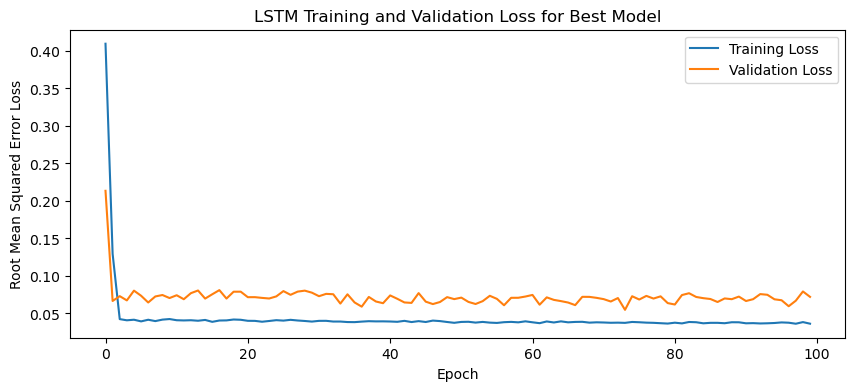

1/1 - 3s - loss: 0.0344 - 3s/epoch - 3s/step
Test Loss: 0.034392278641462326
1/1 [==============================] - 0s 148ms/step


IndexError: index 10 is out of bounds for axis 0 with size 10

In [3]:
n_batch = 1
nb_epoch = 100

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
 
# fit an LSTM network to training data
#Adapted from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch):

    cv_accuracies = []
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters to be tuned by Optuna (taken from Javier Leon's dissertation 'Fruit Prices')
    lr = trial.suggest_float('lr', 1e-3, 1, log=True)
    optimizer_name = trial.suggest_categorical('optimizer', ['Adam', 'RMSprop', 'SGD'])
    if optimizer_name == 'Adam':
        optimizer = Adam(learning_rate=lr)
    elif optimizer_name == 'RMSprop':
        optimizer = RMSprop(learning_rate=lr)
    else:
        optimizer = SGD(learning_rate=lr)
    
    #Optuna will try either Rectified Linear Unit (ReLU) = max(0, x), tanh, or sigmoid functions
    activation_function = trial.suggest_categorical('activation_function', ['relu', 'tanh', 'sigmoid'])
    
    lstm_units = trial.suggest_categorical('lstm_units', [256, 512, 1024])
    dropout_rate = trial.suggest_float('dropout_rate', 0.1, 0.5)

    # design network
    model = Sequential()
    model.add(LSTM(lstm_units, return_sequences=True, batch_input_shape=(n_batch, X.shape[1], X.shape[2]), stateful=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer)
        
    return model

# make forecast with the CNN-LSTM best model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_lstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_lstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # invert first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # propagate difference forecast using inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # create array from forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i - 1
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(test, forecasts, n_lag, n_seq):
    rmse_list = []
    mae_list = []
    mape_list = []
    r2_list = []
    for i in range(n_seq):
        actual = [row[i] for row in test]
        predicted = [forecast[i] for forecast in forecasts]
        rmse = sqrt(mean_squared_error(actual, predicted))
        mae = mean_absolute_error(actual, predicted)
        mse = mean_squared_error(actual, predicted)
        mape = mean_absolute_percentage_error(actual, predicted)
        r2 = r2_score(actual, predicted) 
        rmse_list.append(rmse)
        mae_list.append(mae)
        mape_list.append(mape)
        r2_list.append(r2)
        print("Month at t+"+str(i+1)+":")
        print('t+%d RMSE: %f' % ((i+1), rmse))
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d MAPE: %f' % ((i+1), mape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))

    return rmse_list, mae_list, mape_list, r2_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, n_test):
    # plot the entire dataset in blue
    plt.plot(series.values)
    # plot the forecasts in red
    for i in range(len(forecasts)):
        off_s = len(series) - n_test + i - 1
        off_e = off_s + len(forecasts[i]) + 1
        xaxis = [x for x in range(off_s, off_e)]
        yaxis = [series.values[off_s]] + forecasts[i]
        plt.plot(xaxis, yaxis, color='red')
    # show the plot
    plt.show()
    
def objective(trial):
    
    cv_accuracies = []
        
    for i in range(5):
        train1 = train[i]
        test1 = test[i]
        validation1 = validation[i]

        X, y = train1[:, 0:-n_seq], train1[:, -n_seq:]
        X_test, y_test = test1[:, 0:-n_seq], test1[:, -n_seq:]
        X_val, y_val = validation1[:, 0:-n_seq], validation1[:, -n_seq:]
        X = X.reshape(X.shape[0], 1, X.shape[1])
        X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
        X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])
    
        model = create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch)

        history = model.fit(X, y, validation_data=(X_val, y_val), epochs=nb_epoch, verbose=0)

        cv_accuracy = model.evaluate(X_test, y_test, verbose=0)
    
        loss = history.history['val_loss'][-1]
    
        # Plotting the training and validation loss
        #plt.figure(figsize=(10, 4))
        #plt.plot(history.history['loss'], label='Training Loss')
        #plt.plot(history.history['val_loss'], label='Validation Loss')
        #title1 = "LSTM Training and Validation Loss for Fold " + str(i+1)
        #plt.title(title1)
        #plt.xlabel('Epoch')
        #plt.ylabel('Root Mean Squared Error Loss')
        #plt.legend()
        #plt.show()
            
        cv_accuracies.append(cv_accuracy)
    
    print("Cross Validation Accuracies:")
    print(cv_accuracies)
    print("Mean Cross Validation Accuracy:")
    print(np.mean(cv_accuracies))
    print("Standard Deviation of Cross Validation Accuracy:")
    print(np.std(cv_accuracies))
        
    return np.mean(cv_accuracies)

n_batch = 1
nb_epoch = 100

# optimize and fit model
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100)
print('Number of finished trials:', len(study.trials))

print('Best trial:', study.best_trial.params)
best_params = study.best_params
print("Best hyperparameters: ", best_params)

for i in range(5):
    print("Fold "+str(i+1)+":")
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X, y = train1[:, 0:-n_seq], train1[:, -n_seq:]
    X_test, y_test = test1[:, 0:-n_seq], test1[:, -n_seq:]
    X_val, y_val = validation1[:, 0:-n_seq], validation1[:, -n_seq]

    dataset_df = pd.DataFrame(val_y[i])
    dataset_df = dataset_df.iloc[0:10, :]
    dataset = dataset_df.values

    series = pd.Series(dataset[:, 0]) # Using first column (specific_humidity)
    
    X = X.reshape(X.shape[0], 1, X.shape[1])
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_model(optuna.trial.FixedTrial(best_params), X, y, n_lag, n_seq, n_batch, nb_epoch)
    history=best_model.fit(X, y, epochs=nb_epoch, batch_size=n_batch, validation_data=(X_val, y_val))

    # Plotting the training and validation loss
    plt.figure(figsize=(10, 4))
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title1 = "LSTM Training and Validation Loss for Best Model"
    plt.title(title1)
    plt.xlabel('Epoch')
    plt.ylabel('Root Mean Squared Error Loss')
    plt.legend()
    plt.show()

    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test+2, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test+2, n_seq)

    rmse_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores root mean squared errors for each future time prediction
    mape_list = [] # list stores root mean squared errors for each future time prediction
    r2_list = [] # list stores root mean squared errors for each future time prediction
    
    # evaluate forecasts
    rmse_list, mae_list, mape_list, r2_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    for j in range(len(X_test)):
        print("Weather Station "+str(j+1)+":")
        dataset_df = pd.DataFrame(y_test[j].flatten())
        dataset = dataset_df.values
        dataset = dataset[:, 0]
        dataset = np.array(dataset).reshape(-1, 1)
        dataset = dataset.flatten()
        dataset = pd.DataFrame(dataset)
        series = scaler[i].inverse_transform(dataset)
        series = pd.Series(series.flatten())

    # plot forecasts
    plot_forecasts(series, forecasts, 1)
    
    best_model.summary()

    # Print out table of actual and predicted values for each weather station
    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual Temp\tPredicted Temp\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")

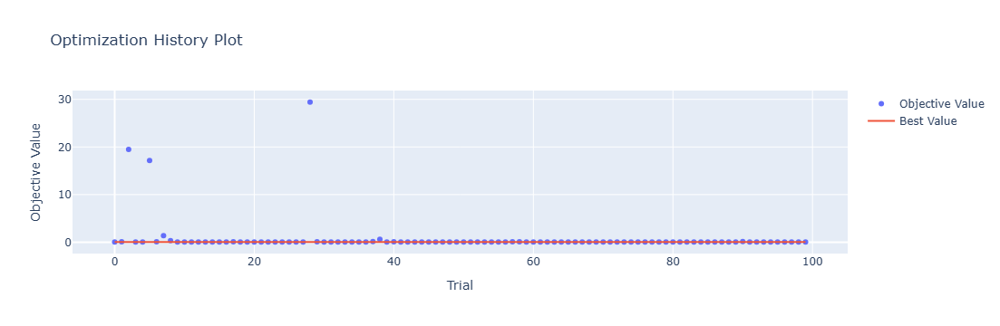

In [4]:
optuna.visualization.plot_optimization_history(study)

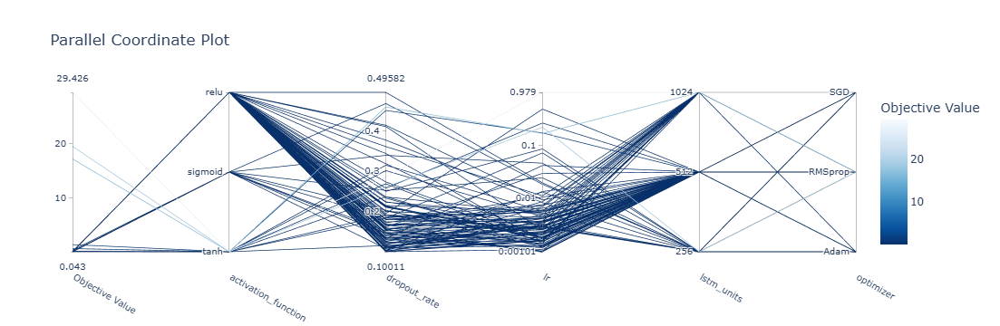

In [5]:
optuna.visualization.plot_parallel_coordinate(study)

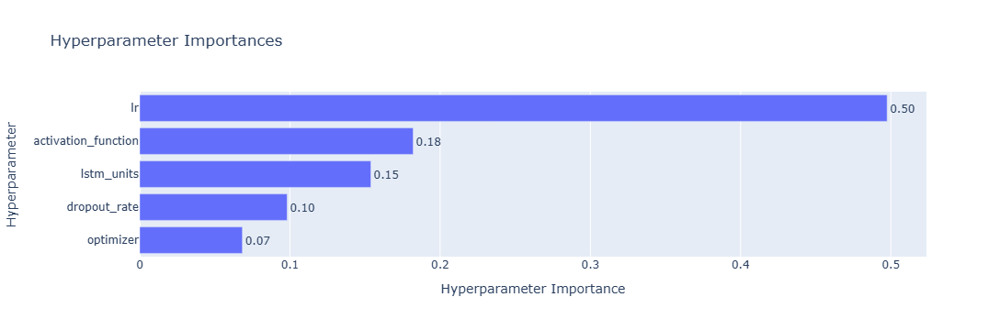

In [6]:
optuna.visualization.plot_param_importances(study)

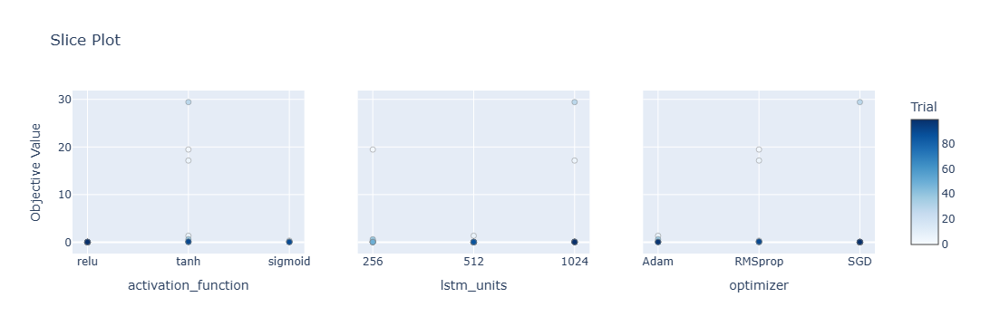

In [7]:
optuna.visualization.plot_slice(study, params=['optimizer', 'activation_function', 'lstm_units'])

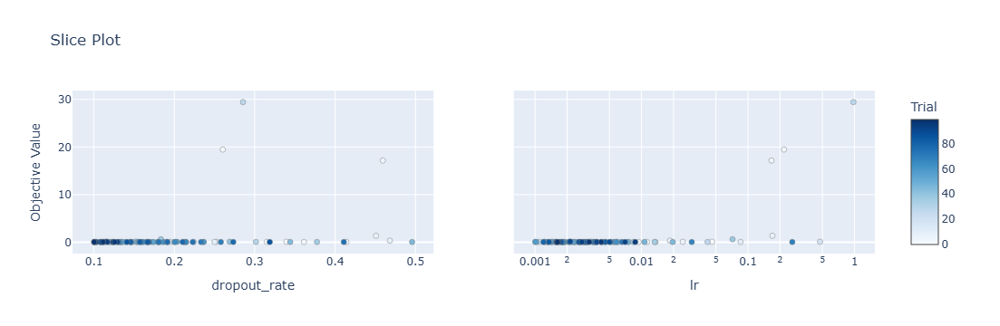

In [8]:
optuna.visualization.plot_slice(study, params=['lr', 'dropout_rate'])

Epoch 1/100
84/84 [==============================] - 9s 58ms/step - loss: 0.3439 - accuracy: 0.4524 - mae: 0.3378 - rmse: 0.3439 - mape: 63.6376 - pearson: 0.4840 - val_loss: 0.1303 - val_accuracy: 0.9000 - val_mae: 0.1233 - val_rmse: 0.1303 - val_mape: 23.5947 - val_pearson: 0.4631
Epoch 2/100
84/84 [==============================] - 3s 39ms/step - loss: 0.0689 - accuracy: 0.7857 - mae: 0.0592 - rmse: 0.0689 - mape: 10.8706 - pearson: 0.7029 - val_loss: 0.0512 - val_accuracy: 0.9000 - val_mae: 0.0418 - val_rmse: 0.0512 - val_mape: 8.1438 - val_pearson: 0.8028
Epoch 3/100
84/84 [==============================] - 3s 41ms/step - loss: 0.0440 - accuracy: 0.8571 - mae: 0.0380 - rmse: 0.0440 - mape: 7.1621 - pearson: 0.8094 - val_loss: 0.0362 - val_accuracy: 0.9000 - val_mae: 0.0298 - val_rmse: 0.0362 - val_mape: 5.8202 - val_pearson: 0.8060
Epoch 4/100
84/84 [==============================] - 3s 40ms/step - loss: 0.0424 - accuracy: 0.8571 - mae: 0.0367 - rmse: 0.0424 - mape: 6.9149 - pears

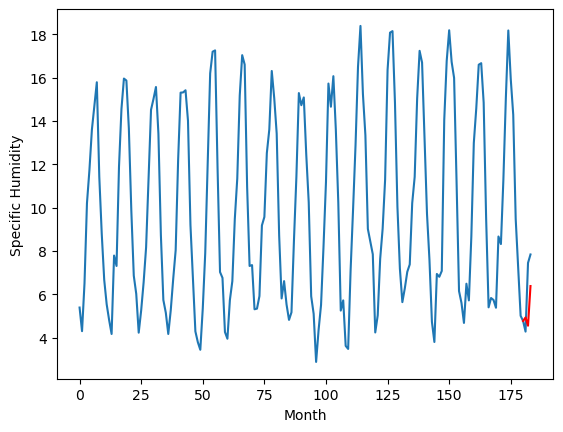

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.90		4.64		-0.26
5.61		4.36		-1.25
7.82		6.16		-1.66
[180, 181, 182, 183]
[7.05, 4.639962840080261, 4.359786826372146, 6.1619803488254545]


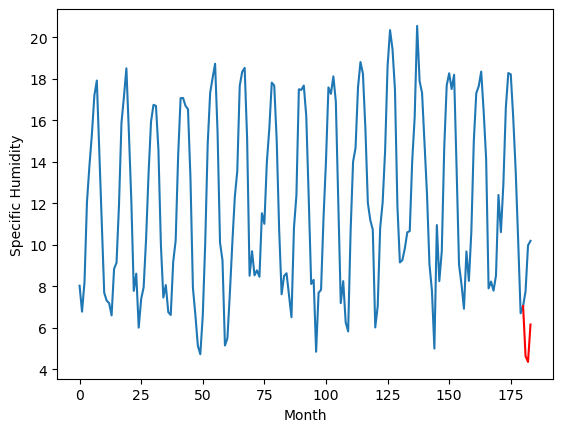

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.82		4.53		-0.29
4.97		4.29		-0.68
6.82		6.10		-0.72
[180, 181, 182, 183]
[5.06, 4.532435881495476, 4.294136720299721, 6.101850586533547]


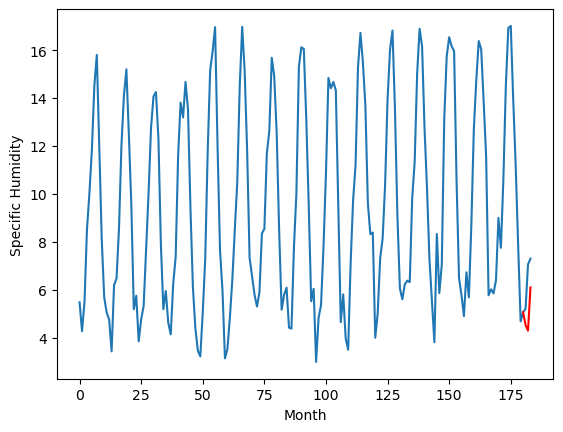

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.21		4.28		0.07
4.12		4.03		-0.09
7.57		5.88		-1.69
[180, 181, 182, 183]
[7.05, 4.2787459635734555, 4.031205757856369, 5.880865558385849]


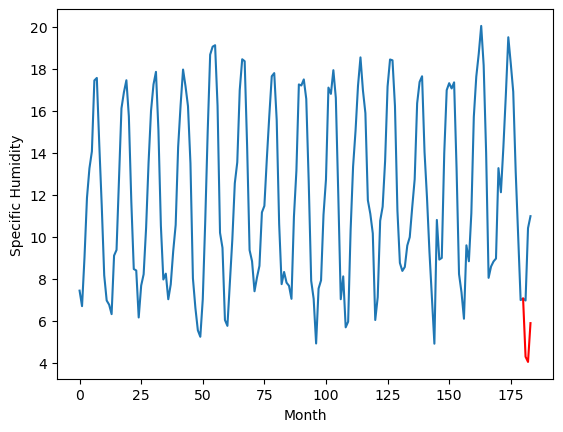

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.32		5.53		0.21
4.92		5.21		0.29
7.76		7.11		-0.65
[180, 181, 182, 183]
[5.2, 5.528218089938163, 5.2143625611066815, 7.105128228068351]


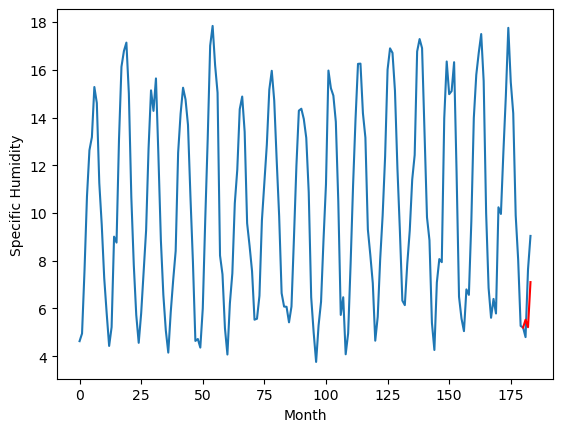

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
7.42		8.14		0.72
8.01		7.87		-0.14
9.58		9.66		0.08
[180, 181, 182, 183]
[5.16, 8.144935927093028, 7.870780578553676, 9.662052265107631]


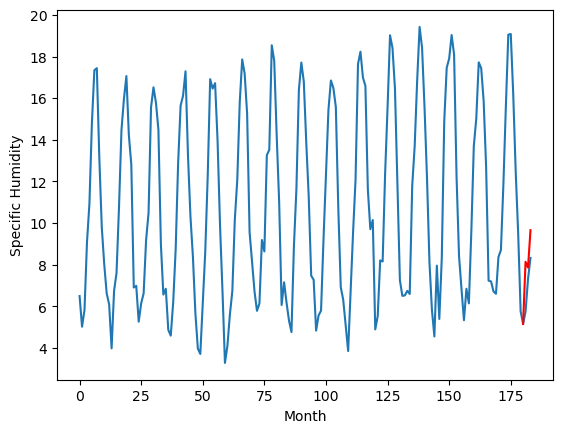

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.33		5.58		0.25
5.38		5.32		-0.06
6.97		7.10		0.13
[180, 181, 182, 183]
[4.05, 5.575013335347176, 5.320047255158425, 7.104502077698708]


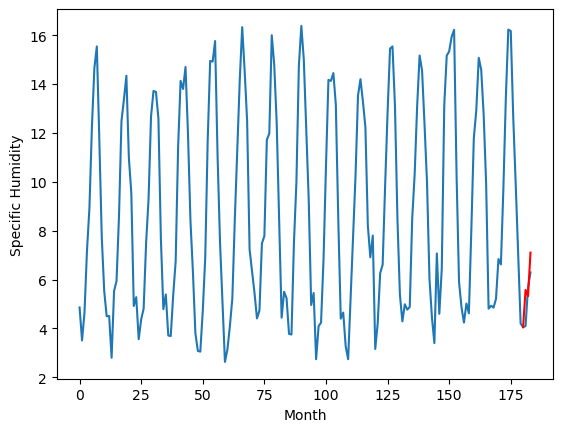

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
7.12		7.52		0.40
7.15		7.27		0.12
8.77		9.05		0.28
[180, 181, 182, 183]
[3.64, 7.516272612214088, 7.271181769967079, 9.047952600121498]


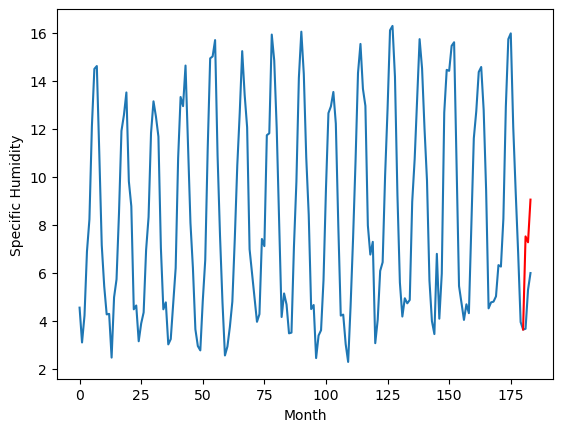

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.40		4.70		0.30
3.72		4.37		0.65
6.78		6.28		-0.50
[180, 181, 182, 183]
[3.46, 4.69865581125021, 4.374395725429058, 6.277595278918743]


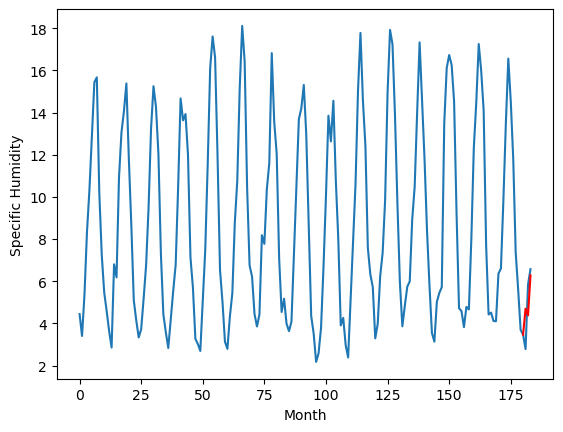

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.17		6.52		0.35
5.72		6.18		0.46
7.52		8.08		0.56
[180, 181, 182, 183]
[2.93, 6.5245944801718, 6.18264170922339, 8.08021649159491]


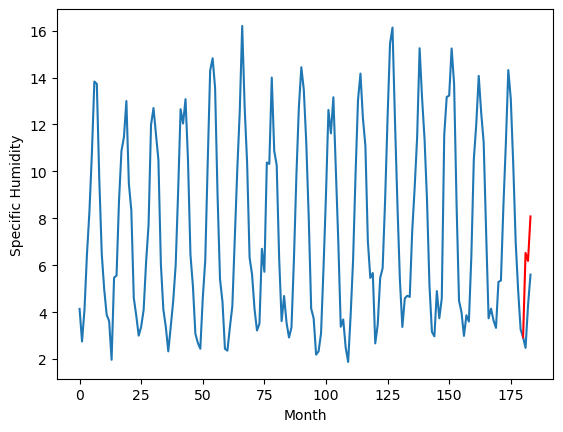

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.48		4.84		0.36
3.74		4.40		0.66
5.36		6.26		0.90
[180, 181, 182, 183]
[2.74, 4.84311060294509, 4.402583700269461, 6.255857330411673]


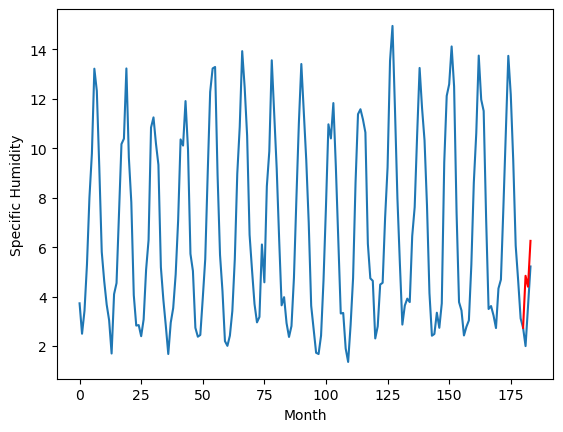

RangeIndex(start=1, stop=12, step=1)
[4.62, 4.899999999999999, 4.820000000000001, 4.209999999999998, 5.32, 7.42, 5.33, 7.119999999999999, 4.4, 6.170000000000001, 4.48]
[4.931790136396885, 4.639962840080261, 4.532435881495476, 4.2787459635734555, 5.528218089938163, 8.144935927093028, 5.575013335347176, 7.516272612214088, 4.69865581125021, 6.5245944801718, 4.84311060294509]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    4.62   4.931790
1                 1    4.90   4.639963
2                 2    4.82   4.532436
3                 3    4.21   4.278746
4                 4    5.32   5.528218
5                 5    7.42   8.144936
6                 6    5.33   5.575013
7                 7    7.12   7.516273
8                 8    4.40   4.698656
9                 9    6.17   6.524594
10               10    4.48   4.843111


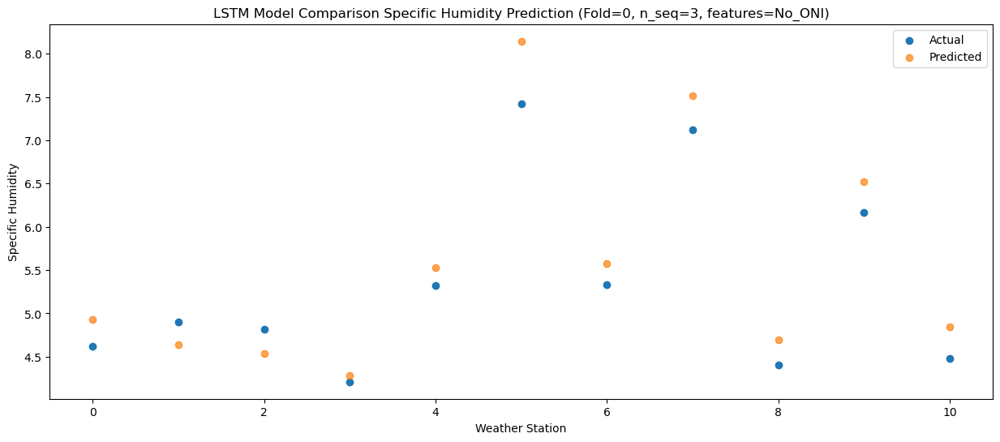

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    4.13   4.550331
1                 1    5.61   4.359787
2                 2    4.97   4.294137
3                 3    4.12   4.031206
4                 4    4.92   5.214363
5                 5    8.01   7.870781
6                 6    5.38   5.320047
7                 7    7.15   7.271182
8                 8    3.72   4.374396
9                 9    5.72   6.182642
10               10    3.74   4.402584


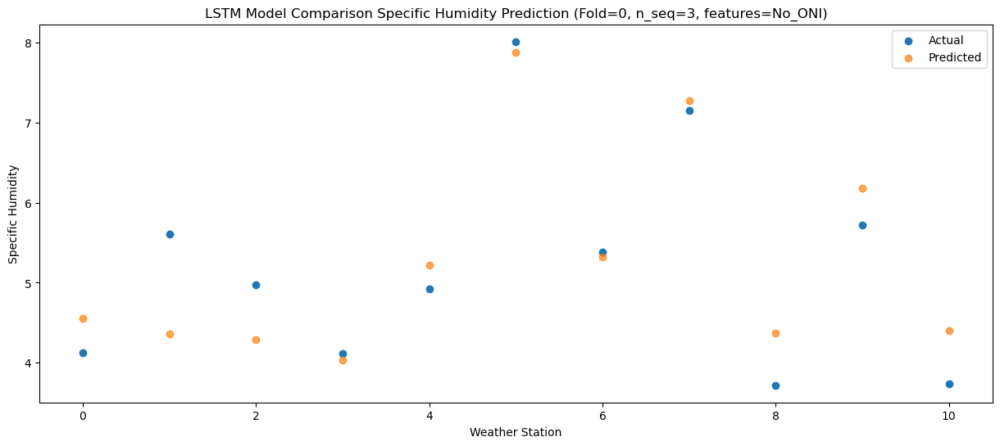

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    7.30   6.382495
1                 1    7.82   6.161980
2                 2    6.82   6.101851
3                 3    7.57   5.880866
4                 4    7.76   7.105128
5                 5    9.58   9.662052
6                 6    6.97   7.104502
7                 7    8.77   9.047953
8                 8    6.78   6.277595
9                 9    7.52   8.080216
10               10    5.36   6.255857


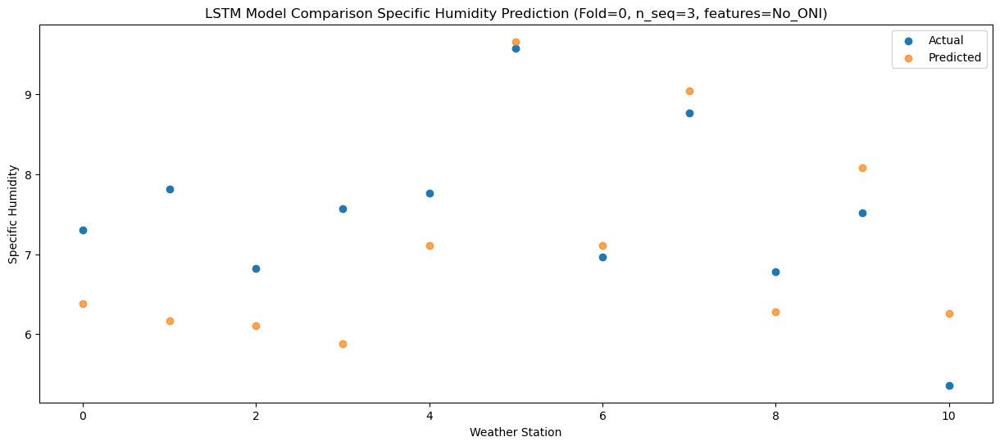

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_10 (LSTM)              (1, 1, 1024)              12263424  
                                                                 
 dropout_10 (Dropout)        (1, 1, 1024)              0         
                                                                 
 lstm_11 (LSTM)              (1, 1024)                 8392704   
                                                                 
 dropout_11 (Dropout)        (1, 1024)                 0         
                                                                 
 dense_15 (Dense)            (1, 256)                  262400    
                                                                 
 dense_16 (Dense)            (1, 128)                  32896     
                                                                 
 dense_17 (Dense)            (1, 3)                   

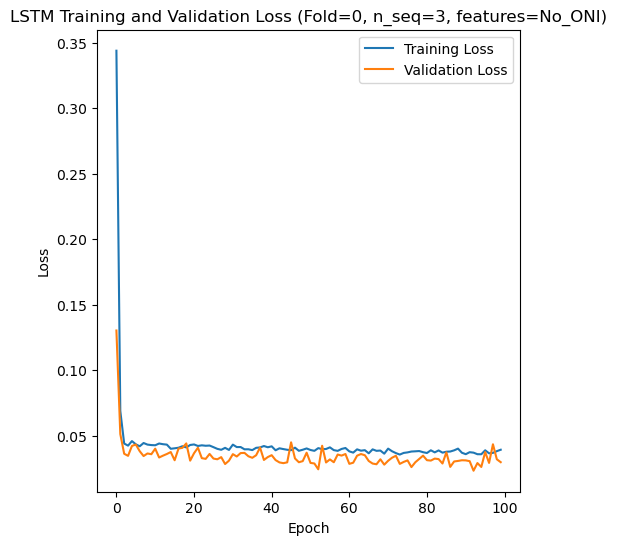

Epoch 1/100
84/84 [==============================] - 41s 113ms/step - loss: 0.3914 - accuracy: 0.8452 - mae: 0.3885 - rmse: 0.3914 - mape: 74.1004 - pearson: 0.6962 - val_loss: 0.2013 - val_accuracy: 0.9000 - val_mae: 0.1937 - val_rmse: 0.2013 - val_mape: 36.8487 - val_pearson: 0.8547
Epoch 2/100
84/84 [==============================] - 5s 58ms/step - loss: 0.0845 - accuracy: 0.8690 - mae: 0.0778 - rmse: 0.0845 - mape: 14.6820 - pearson: 0.8019 - val_loss: 0.0425 - val_accuracy: 0.9000 - val_mae: 0.0375 - val_rmse: 0.0425 - val_mape: 7.2350 - val_pearson: 0.9005
Epoch 3/100
84/84 [==============================] - 3s 41ms/step - loss: 0.0441 - accuracy: 0.8690 - mae: 0.0369 - rmse: 0.0441 - mape: 6.9072 - pearson: 0.7887 - val_loss: 0.0433 - val_accuracy: 0.9000 - val_mae: 0.0382 - val_rmse: 0.0433 - val_mape: 7.3433 - val_pearson: 0.8865
Epoch 4/100
84/84 [==============================] - 4s 43ms/step - loss: 0.0420 - accuracy: 0.8690 - mae: 0.0363 - rmse: 0.0420 - mape: 6.7639 - pea

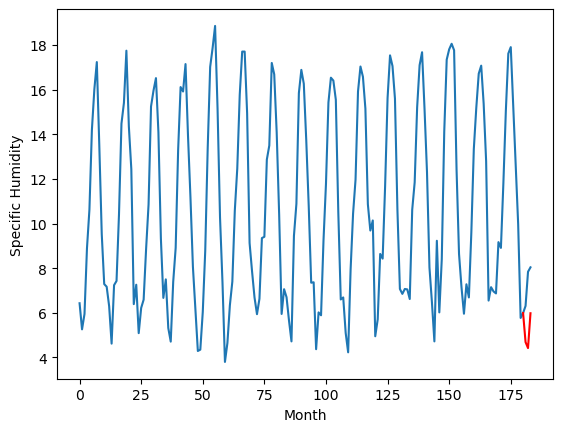

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.34		4.21		-0.13
4.53		3.95		-0.58
6.06		5.55		-0.51
[180, 181, 182, 183]
[4.15, 4.208081207871437, 3.9546295922994616, 5.551128439307213]


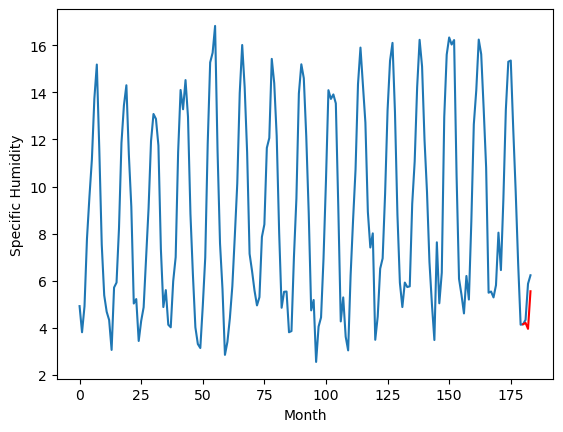

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.22		2.99		-0.23
3.22		2.75		-0.47
5.84		4.39		-1.45
[180, 181, 182, 183]
[5.12, 2.9901640486717223, 2.7477603924274443, 4.38567731499672]


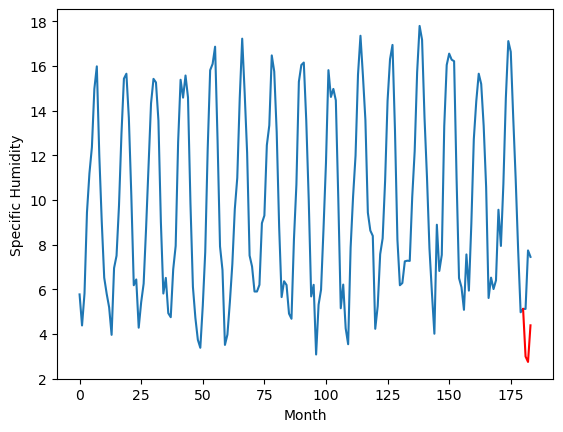

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.03		2.32		0.29
2.10		2.10		-0.00
4.74		3.78		-0.96
[180, 181, 182, 183]
[6.35, 2.32409344881773, 2.0969166931509973, 3.777889507710934]


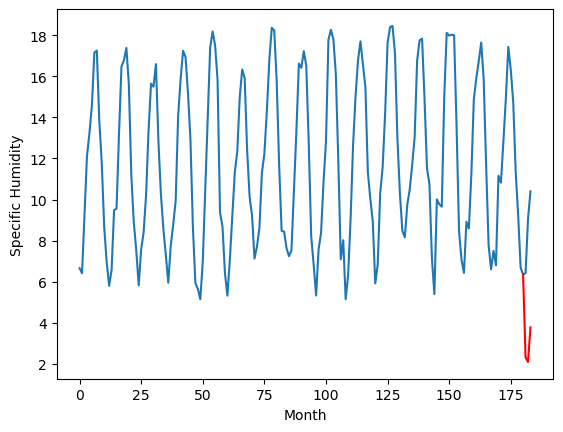

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.18		6.40		0.22
6.22		6.17		-0.05
8.94		7.86		-1.08
[180, 181, 182, 183]
[6.08, 6.397705812305212, 6.16522138223052, 7.862419773191213]


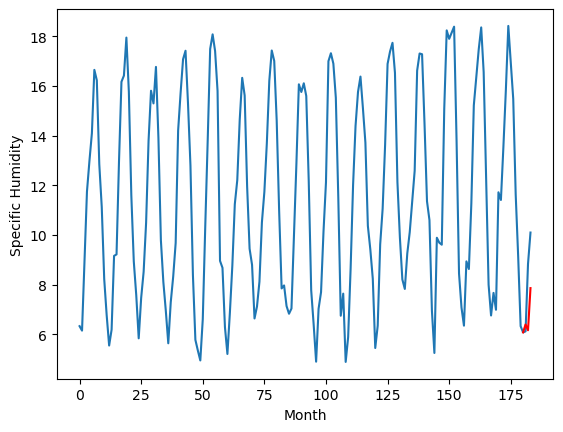

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.75		4.86		-0.89
5.12		4.59		-0.53
5.91		6.17		0.26
[180, 181, 182, 183]
[3.92, 4.861786244511604, 4.588762519955635, 6.167400000691414]


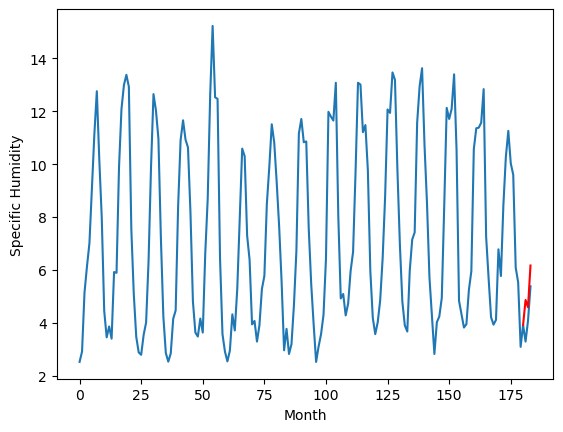

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.66		5.70		0.04
5.78		5.48		-0.30
7.34		7.10		-0.24
[180, 181, 182, 183]
[4.16, 5.702926602661609, 5.477766555249691, 7.096446436345577]


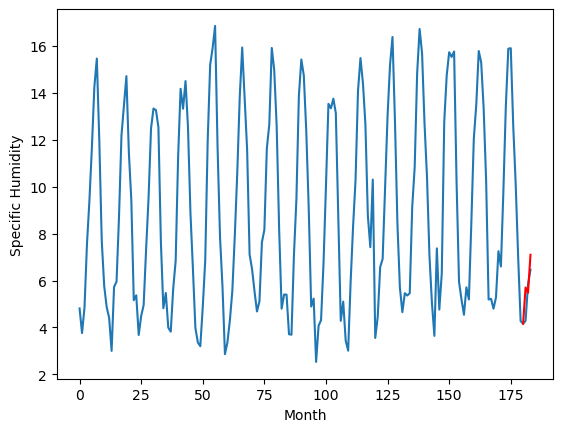

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.53		6.61		0.08
6.01		6.34		0.33
8.74		8.02		-0.72
[180, 181, 182, 183]
[3.84, 6.606630816906691, 6.34007392808795, 8.01581548139453]


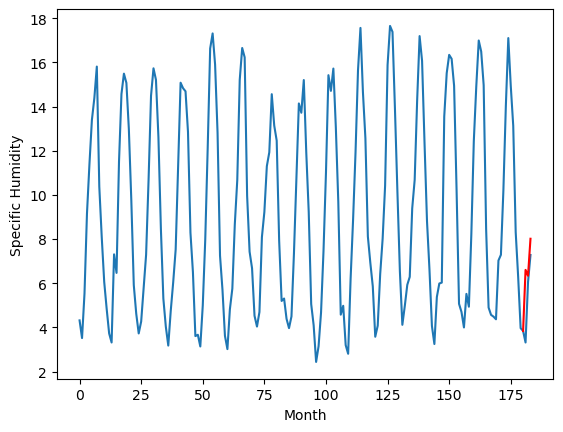

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.49		6.29		-0.20
5.68		5.99		0.31
8.29		7.65		-0.64
[180, 181, 182, 183]
[3.73, 6.290567057132721, 5.986681537628174, 7.65283353805542]


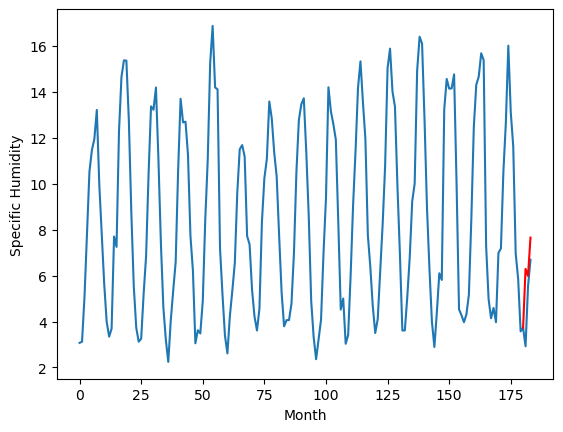

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.71		2.46		-0.25
1.97		2.11		0.14
3.79		3.70		-0.09
[180, 181, 182, 183]
[2.83, 2.462329578101635, 2.106932174861431, 3.7016637441515923]


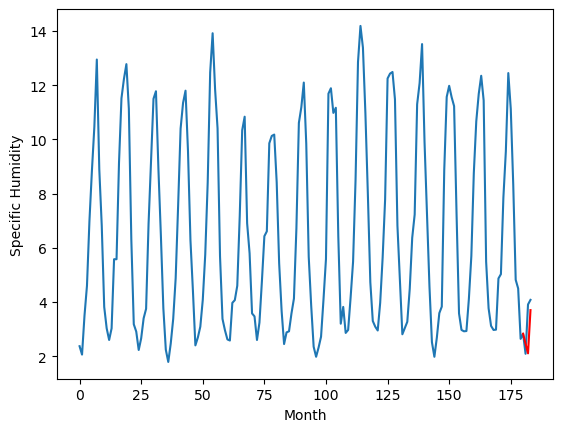

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.08		4.65		0.57
4.12		4.31		0.19
5.36		5.81		0.45
[180, 181, 182, 183]
[2.69, 4.648325500488281, 4.307436195611953, 5.808919159173965]


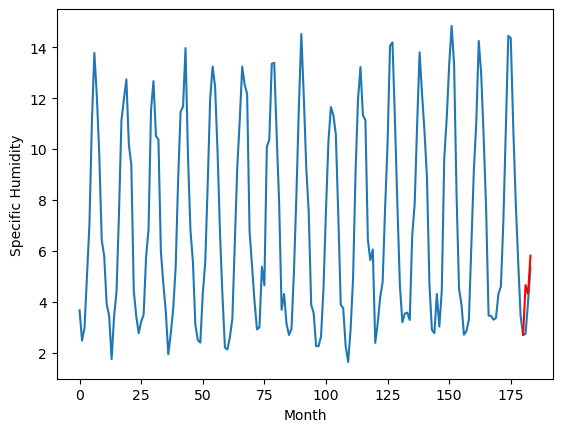

RangeIndex(start=1, stop=12, step=1)
[5.03, 4.340000000000002, 3.2199999999999998, 2.0299999999999994, 6.18, 5.75, 5.66, 6.529999999999999, 6.49, 2.7100000000000004, 4.079999999999999]
[4.688347590565681, 4.208081207871437, 2.9901640486717223, 2.32409344881773, 6.397705812305212, 4.861786244511604, 5.702926602661609, 6.606630816906691, 6.290567057132721, 2.462329578101635, 4.648325500488281]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    5.03   4.688348
1                 1    4.34   4.208081
2                 2    3.22   2.990164
3                 3    2.03   2.324093
4                 4    6.18   6.397706
5                 5    5.75   4.861786
6                 6    5.66   5.702927
7                 7    6.53   6.606631
8                 8    6.49   6.290567
9                 9    2.71   2.462330
10               10    4.08   4.648326


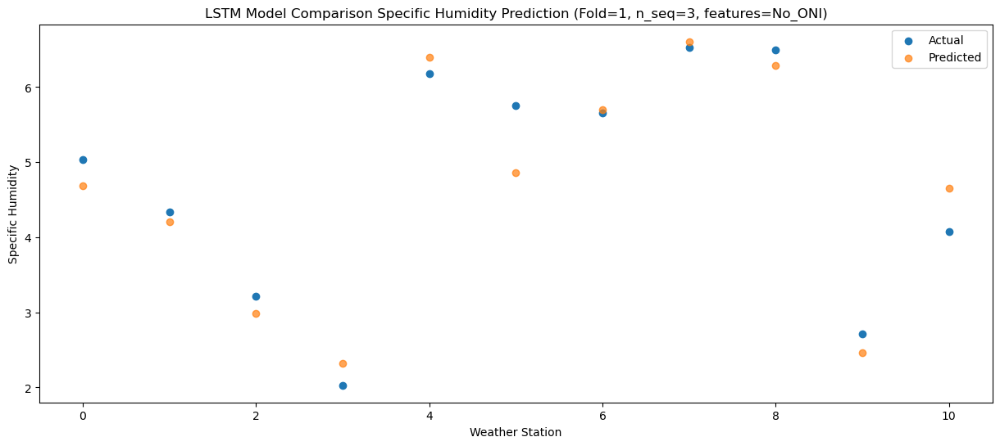

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    5.35   4.420426
1                 1    4.53   3.954630
2                 2    3.22   2.747760
3                 3    2.10   2.096917
4                 4    6.22   6.165221
5                 5    5.12   4.588763
6                 6    5.78   5.477767
7                 7    6.01   6.340074
8                 8    5.68   5.986682
9                 9    1.97   2.106932
10               10    4.12   4.307436


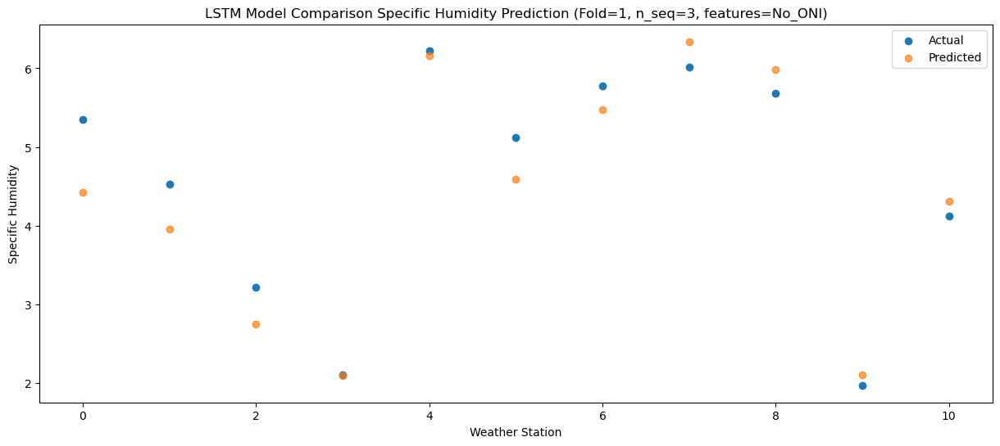

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    6.88   5.981775
1                 1    6.06   5.551128
2                 2    5.84   4.385677
3                 3    4.74   3.777890
4                 4    8.94   7.862420
5                 5    5.91   6.167400
6                 6    7.34   7.096446
7                 7    8.74   8.015815
8                 8    8.29   7.652834
9                 9    3.79   3.701664
10               10    5.36   5.808919


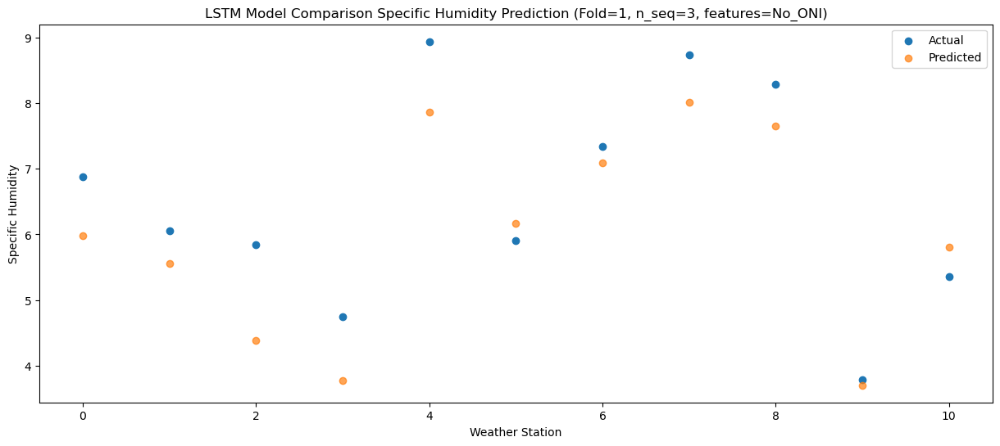

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_12 (LSTM)              (1, 1, 1024)              12263424  
                                                                 
 dropout_12 (Dropout)        (1, 1, 1024)              0         
                                                                 
 lstm_13 (LSTM)              (1, 1024)                 8392704   
                                                                 
 dropout_13 (Dropout)        (1, 1024)                 0         
                                                                 
 dense_18 (Dense)            (1, 256)                  262400    
                                                                 
 dense_19 (Dense)            (1, 128)                  32896     
                                                                 
 dense_20 (Dense)            (1, 3)                   

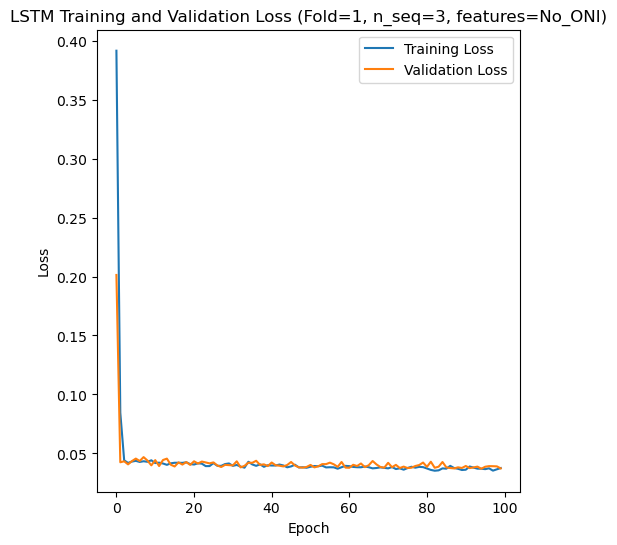

Epoch 1/100
84/84 [==============================] - 20s 151ms/step - loss: 0.3680 - accuracy: 0.4762 - mae: 0.3614 - rmse: 0.3680 - mape: 68.4557 - pearson: 0.3967 - val_loss: 0.1555 - val_accuracy: 0.0000e+00 - val_mae: 0.1387 - val_rmse: 0.1555 - val_mape: 26.2679 - val_pearson: 0.2349
Epoch 2/100
84/84 [==============================] - 6s 74ms/step - loss: 0.0681 - accuracy: 0.7857 - mae: 0.0592 - rmse: 0.0681 - mape: 10.9647 - pearson: 0.6730 - val_loss: 0.0280 - val_accuracy: 1.0000 - val_mae: 0.0253 - val_rmse: 0.0280 - val_mape: 4.9070 - val_pearson: 0.8982
Epoch 3/100
84/84 [==============================] - 6s 71ms/step - loss: 0.0446 - accuracy: 0.8810 - mae: 0.0380 - rmse: 0.0446 - mape: 7.1469 - pearson: 0.8094 - val_loss: 0.0298 - val_accuracy: 1.0000 - val_mae: 0.0270 - val_rmse: 0.0298 - val_mape: 5.2503 - val_pearson: 0.9259
Epoch 4/100
84/84 [==============================] - 8s 94ms/step - loss: 0.0448 - accuracy: 0.8810 - mae: 0.0379 - rmse: 0.0448 - mape: 7.0621 -

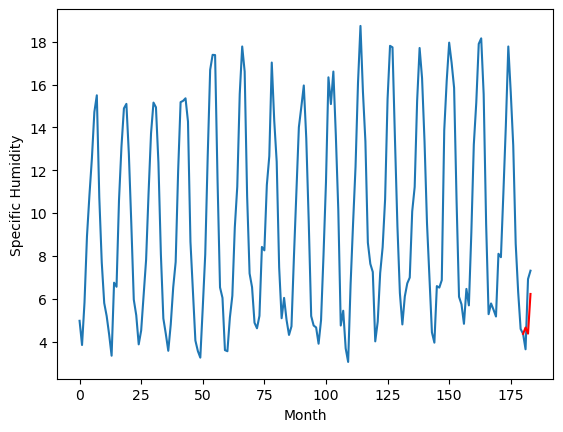

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
1.84		1.96		0.12
1.16		1.65		0.49
3.01		3.43		0.42
[180, 181, 182, 183]
[2.82, 1.9605132707953452, 1.6459281215071677, 3.425597167909145]


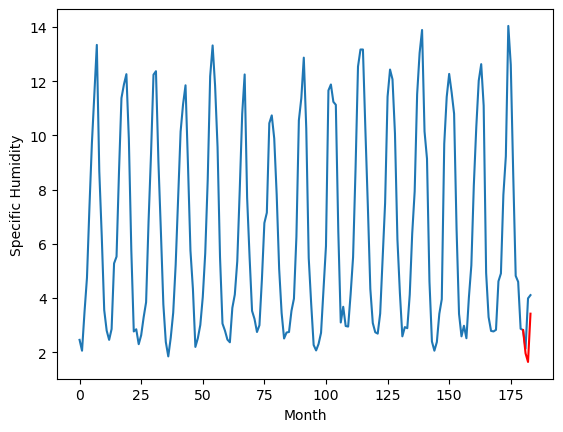

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.53		5.15		-0.38
7.66		4.97		-2.69
7.88		6.66		-1.22
[180, 181, 182, 183]
[9.16, 5.148824267983437, 4.971332364678383, 6.656680279374123]


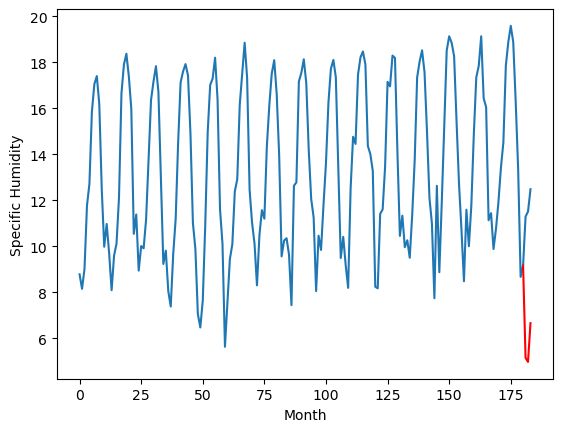

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.98		5.05		1.07
4.15		4.82		0.67
4.79		6.38		1.59
[180, 181, 182, 183]
[2.44, 5.05012694787234, 4.818901293389499, 6.375652544610202]


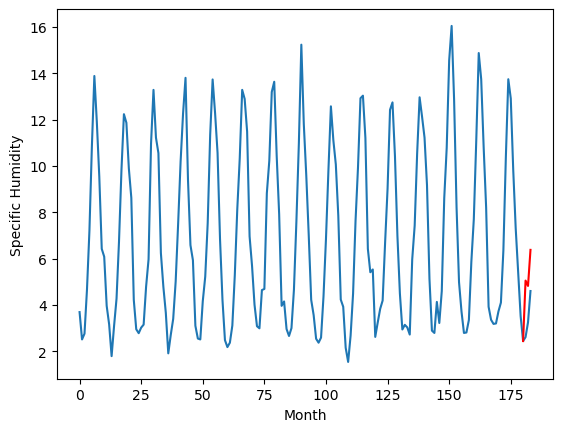

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.10		5.07		-0.03
5.08		4.94		-0.14
8.37		6.64		-1.73
[180, 181, 182, 183]
[6.65, 5.0714536321163175, 4.935542808175087, 6.638178930878639]


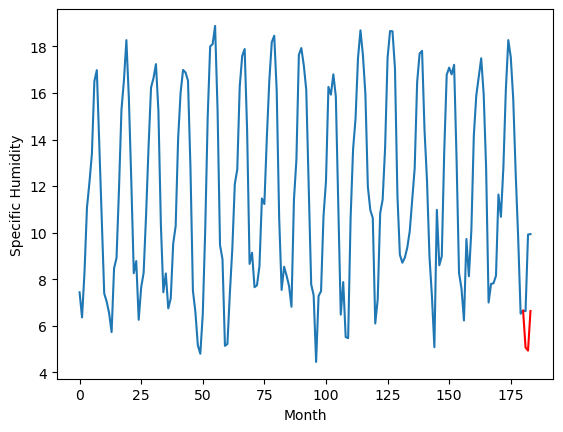

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.33		2.60		0.27
2.28		2.46		0.18
5.27		4.22		-1.05
[180, 181, 182, 183]
[6.19, 2.5995979672670364, 2.462585619688034, 4.222915700674057]


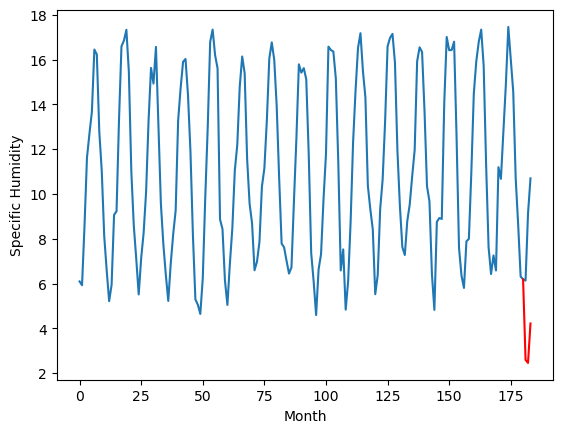

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
8.68		8.93		0.25
8.35		8.75		0.40
11.21		10.57		-0.64
[180, 181, 182, 183]
[4.78, 8.934875621199607, 8.750037519931793, 10.573748319149017]


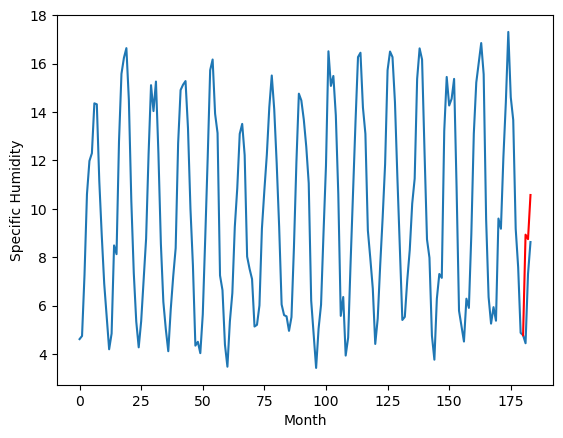

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.97		3.82		-0.15
3.84		3.64		-0.20
3.93		5.31		1.38
[180, 181, 182, 183]
[2.61, 3.8214926594495773, 3.6423843973875045, 5.305382835268974]


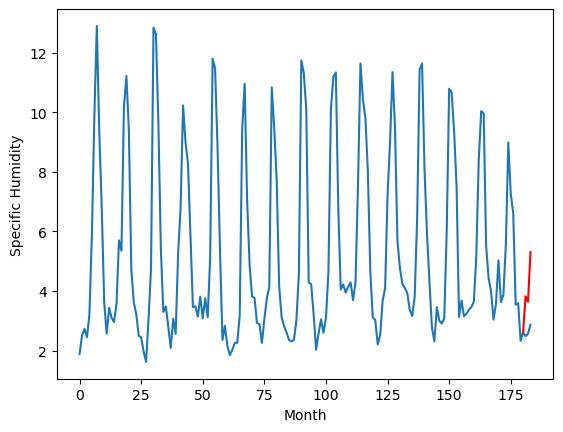

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
8.29		7.59		-0.70
8.82		7.41		-1.41
8.93		8.88		-0.05
[180, 181, 182, 183]
[4.6, 7.591078715920449, 7.410328703522683, 8.880862312912942]


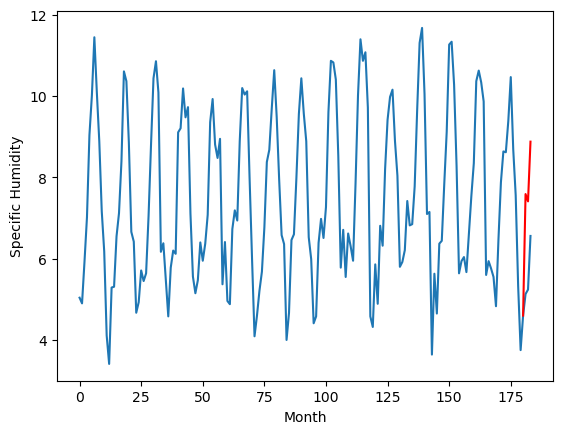

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.98		6.22		0.24
6.05		6.08		0.03
7.78		7.66		-0.12
[180, 181, 182, 183]
[4.27, 6.223356714844703, 6.083877435326576, 7.661874642968177]


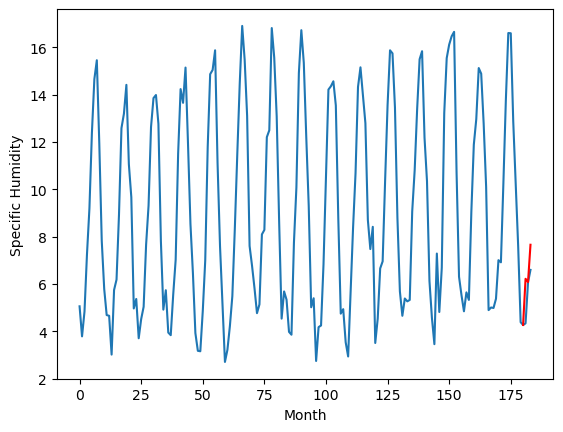

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.63		4.73		0.10
4.87		4.58		-0.29
5.90		6.21		0.31
[180, 181, 182, 183]
[3.91, 4.727011057436466, 4.579023229777813, 6.214789139926434]


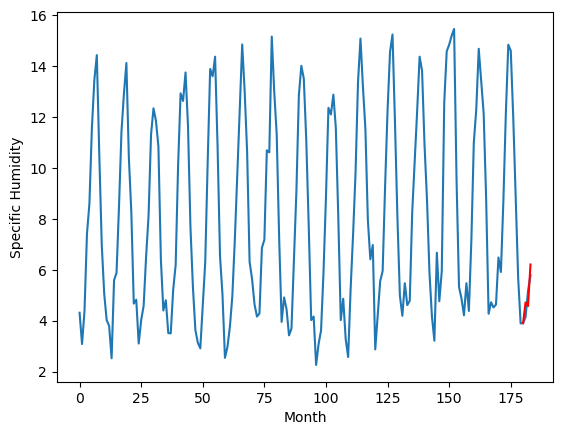

RangeIndex(start=1, stop=12, step=1)
[4.390000000000001, 1.8399999999999992, 5.529999999999999, 3.9799999999999995, 5.1, 2.33, 8.68, 3.9700000000000006, 8.29, 5.9799999999999995, 4.63]
[4.6553066585958005, 1.9605132707953452, 5.148824267983437, 5.05012694787234, 5.0714536321163175, 2.5995979672670364, 8.934875621199607, 3.8214926594495773, 7.591078715920449, 6.223356714844703, 4.727011057436466]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    4.39   4.655307
1                 1    1.84   1.960513
2                 2    5.53   5.148824
3                 3    3.98   5.050127
4                 4    5.10   5.071454
5                 5    2.33   2.599598
6                 6    8.68   8.934876
7                 7    3.97   3.821493
8                 8    8.29   7.591079
9                 9    5.98   6.223357
10               10    4.63   4.727011


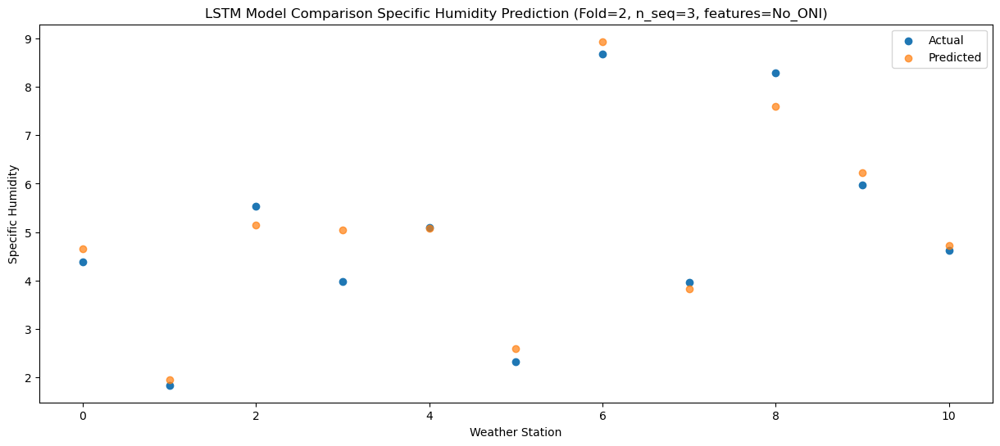

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    3.67   4.370169
1                 1    1.16   1.645928
2                 2    7.66   4.971332
3                 3    4.15   4.818901
4                 4    5.08   4.935543
5                 5    2.28   2.462586
6                 6    8.35   8.750038
7                 7    3.84   3.642384
8                 8    8.82   7.410329
9                 9    6.05   6.083877
10               10    4.87   4.579023


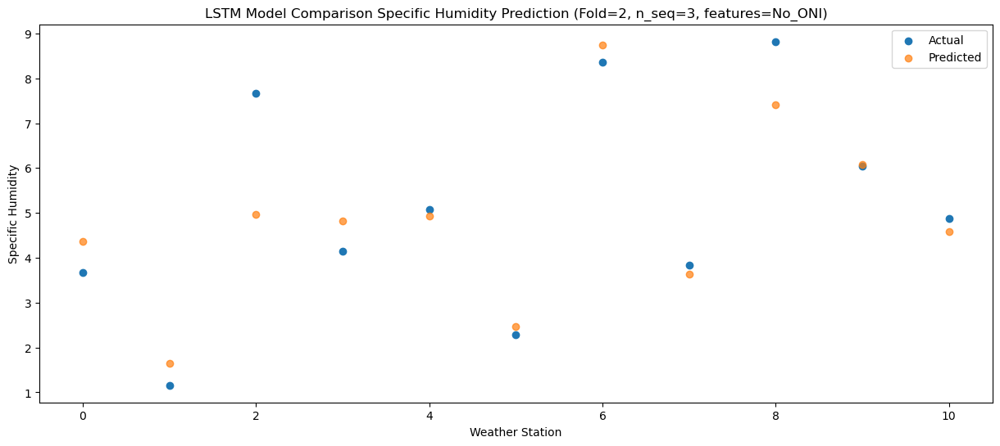

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    6.95   6.223714
1                 1    3.01   3.425597
2                 2    7.88   6.656680
3                 3    4.79   6.375653
4                 4    8.37   6.638179
5                 5    5.27   4.222916
6                 6   11.21  10.573748
7                 7    3.93   5.305383
8                 8    8.93   8.880862
9                 9    7.78   7.661875
10               10    5.90   6.214789


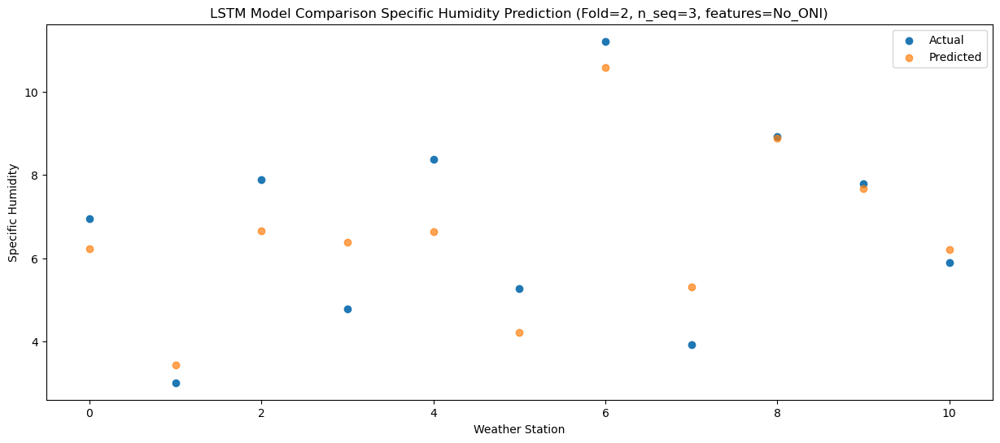

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_14 (LSTM)              (1, 1, 1024)              12263424  
                                                                 
 dropout_14 (Dropout)        (1, 1, 1024)              0         
                                                                 
 lstm_15 (LSTM)              (1, 1024)                 8392704   
                                                                 
 dropout_15 (Dropout)        (1, 1024)                 0         
                                                                 
 dense_21 (Dense)            (1, 256)                  262400    
                                                                 
 dense_22 (Dense)            (1, 128)                  32896     
                                                                 
 dense_23 (Dense)            (1, 3)                   

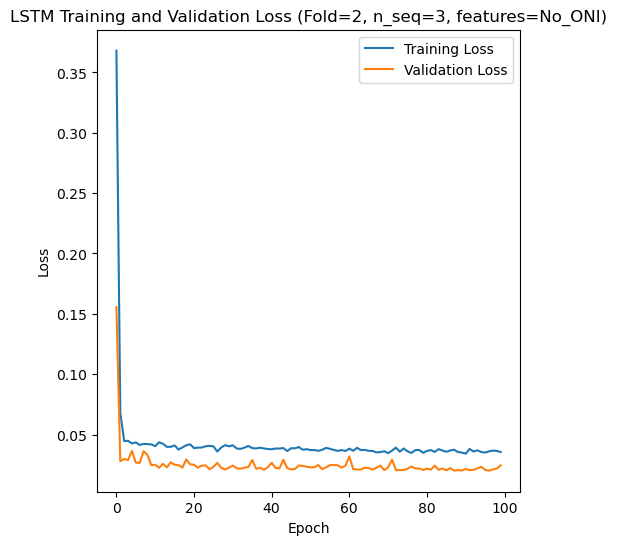

Epoch 1/100
84/84 [==============================] - 49s 209ms/step - loss: 0.4234 - accuracy: 0.5714 - mae: 0.4193 - rmse: 0.4234 - mape: 79.2443 - pearson: 0.4788 - val_loss: 0.2645 - val_accuracy: 0.8000 - val_mae: 0.2627 - val_rmse: 0.2645 - val_mape: 50.8575 - val_pearson: 0.8590
Epoch 2/100
84/84 [==============================] - 8s 97ms/step - loss: 0.1371 - accuracy: 0.9048 - mae: 0.1316 - rmse: 0.1371 - mape: 24.7286 - pearson: 0.8447 - val_loss: 0.0516 - val_accuracy: 0.8000 - val_mae: 0.0432 - val_rmse: 0.0516 - val_mape: 8.3385 - val_pearson: 0.8515
Epoch 3/100
84/84 [==============================] - 9s 108ms/step - loss: 0.0402 - accuracy: 0.9048 - mae: 0.0341 - rmse: 0.0402 - mape: 6.3451 - pearson: 0.8332 - val_loss: 0.0347 - val_accuracy: 0.8000 - val_mae: 0.0291 - val_rmse: 0.0347 - val_mape: 5.7903 - val_pearson: 0.8172
Epoch 4/100
84/84 [==============================] - 8s 98ms/step - loss: 0.0419 - accuracy: 0.9048 - mae: 0.0350 - rmse: 0.0419 - mape: 6.4756 - pe

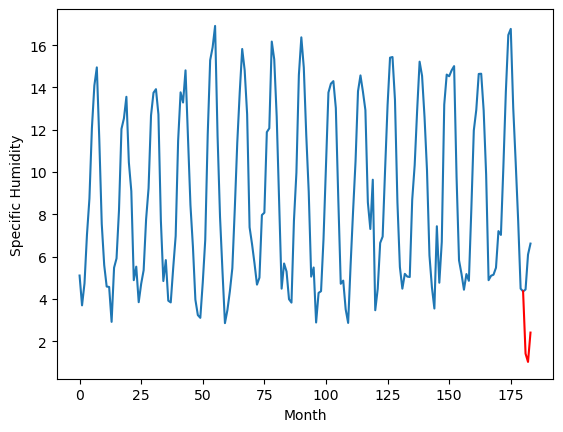

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.64		2.47		-0.17
2.08		2.04		-0.04
4.59		3.61		-0.98
[180, 181, 182, 183]
[3.43, 2.4739105212688446, 2.038242231607437, 3.6092652189731598]


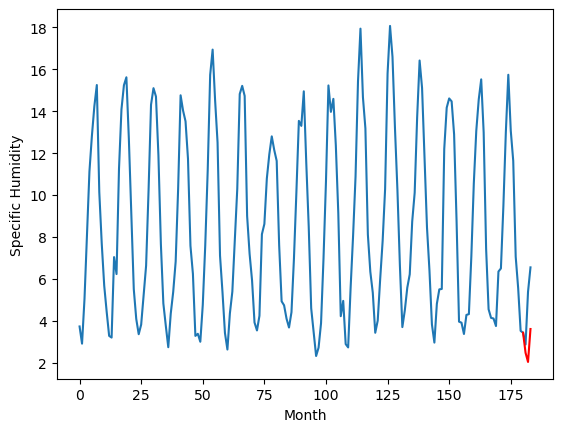

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.37		5.72		-0.65
6.31		5.30		-1.01
6.39		6.68		0.29
[180, 181, 182, 183]
[5.43, 5.724067427515983, 5.2989143806695935, 6.675975747704506]


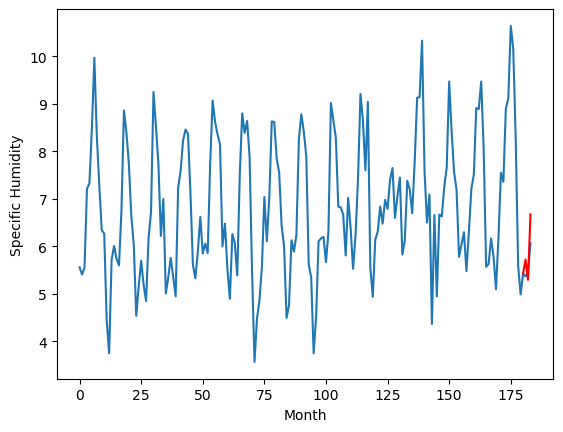

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.44		3.44		-0.00
3.37		3.01		-0.36
4.67		4.46		-0.21
[180, 181, 182, 183]
[3.21, 3.438745013475418, 3.008610121011734, 4.461219063997269]


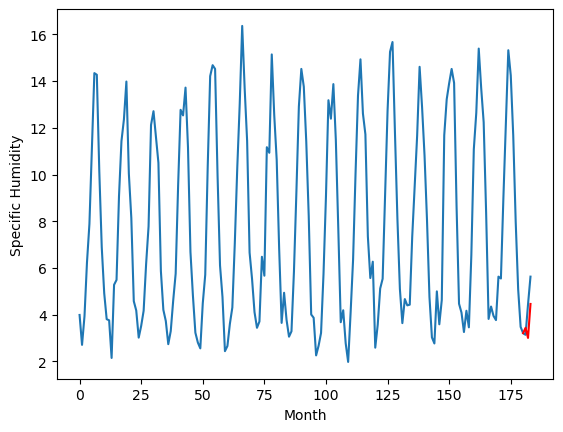

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.91		4.84		-0.07
4.08		4.38		0.30
6.56		5.93		-0.63
[180, 181, 182, 183]
[3.04, 4.838195875883103, 4.382482216358185, 5.925319478511811]


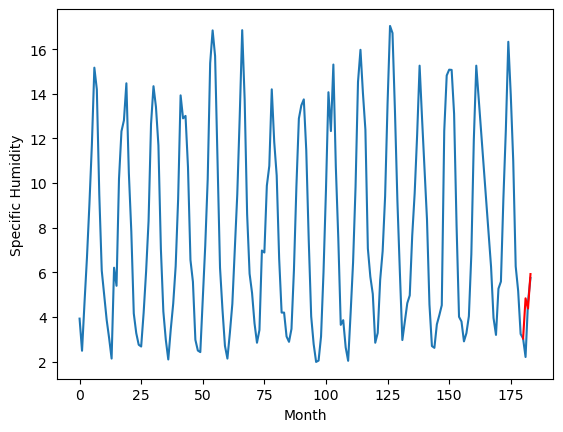

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.42		3.44		0.02
2.90		2.96		0.06
4.93		4.50		-0.43
[180, 181, 182, 183]
[2.91, 3.4383085775375366, 2.962291877269745, 4.503980677127839]


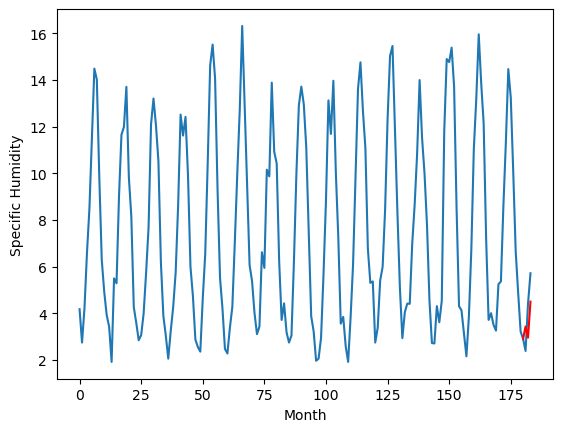

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.73		5.32		-0.41
5.79		4.85		-0.94
6.10		6.31		0.21
[180, 181, 182, 183]
[1.6, 5.320713264346122, 4.854302567839622, 6.306027931571006]


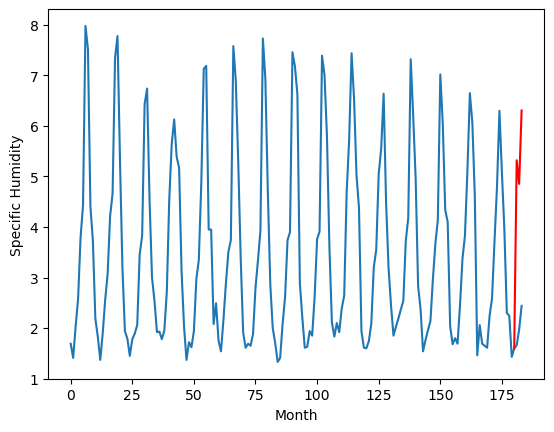

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.80		3.77		-1.03
4.32		3.31		-1.01
4.62		4.69		0.07
[180, 181, 182, 183]
[2.86, 3.773493667840958, 3.313663890361786, 4.689531257152558]


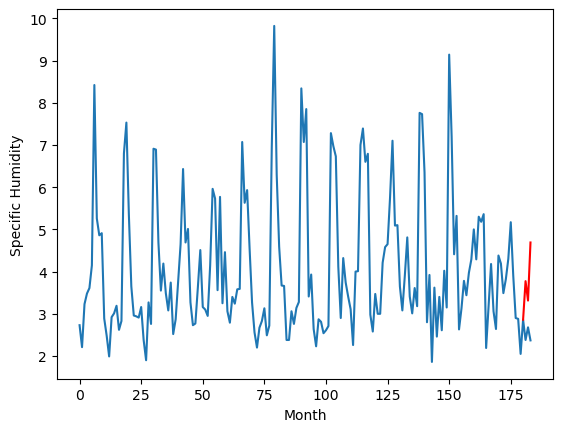

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.60		3.72		-0.88
4.25		3.29		-0.96
3.90		4.56		0.66
[180, 181, 182, 183]
[5.65, 3.723142691254616, 3.2860580462217333, 4.558598019480705]


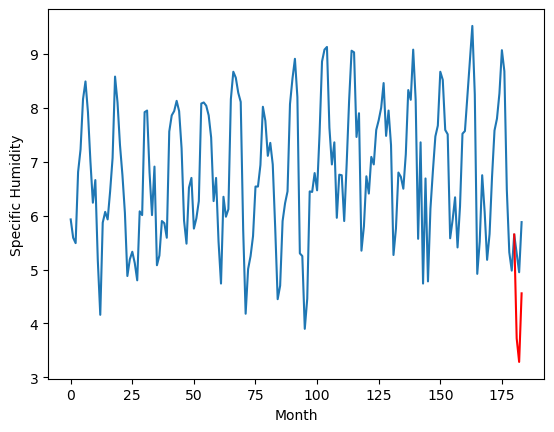

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.09		3.86		0.77
3.24		3.42		0.18
4.02		4.66		0.64
[180, 181, 182, 183]
[2.54, 3.860398881435394, 3.4217340278625485, 4.656608037948608]


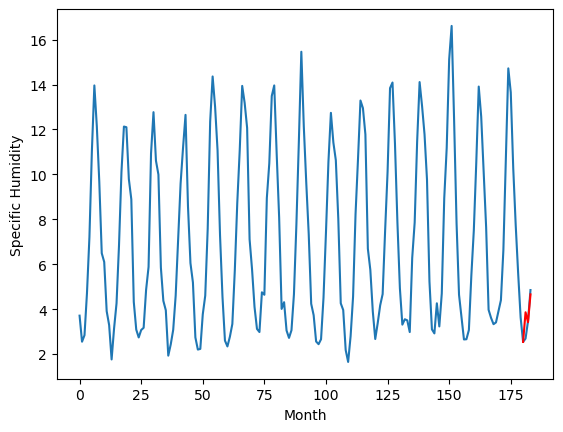

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
1.00		1.32		0.32
0.86		0.89		0.03
2.14		2.13		-0.01
[180, 181, 182, 183]
[2.51, 1.321497323513031, 0.8852697336673736, 2.1255335533618926]


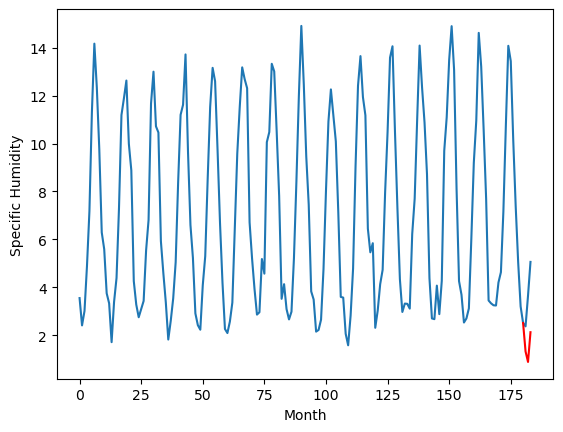

RangeIndex(start=1, stop=12, step=1)
[1.5600000000000005, 2.64, 6.369999999999998, 3.4399999999999995, 4.91, 3.42, 5.73, 4.800000000000001, 4.6, 3.09, 0.9999999999999993]
[1.4163879776000976, 2.4739105212688446, 5.724067427515983, 3.438745013475418, 4.838195875883103, 3.4383085775375366, 5.320713264346122, 3.773493667840958, 3.723142691254616, 3.860398881435394, 1.321497323513031]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    1.56   1.416388
1                 1    2.64   2.473911
2                 2    6.37   5.724067
3                 3    3.44   3.438745
4                 4    4.91   4.838196
5                 5    3.42   3.438309
6                 6    5.73   5.320713
7                 7    4.80   3.773494
8                 8    4.60   3.723143
9                 9    3.09   3.860399
10               10    1.00   1.321497


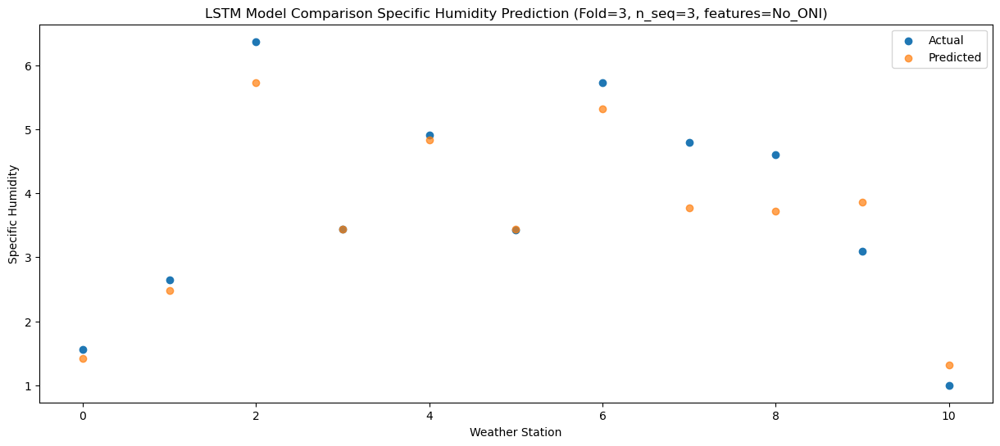

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    1.65   1.026264
1                 1    2.08   2.038242
2                 2    6.31   5.298914
3                 3    3.37   3.008610
4                 4    4.08   4.382482
5                 5    2.90   2.962292
6                 6    5.79   4.854303
7                 7    4.32   3.313664
8                 8    4.25   3.286058
9                 9    3.24   3.421734
10               10    0.86   0.885270


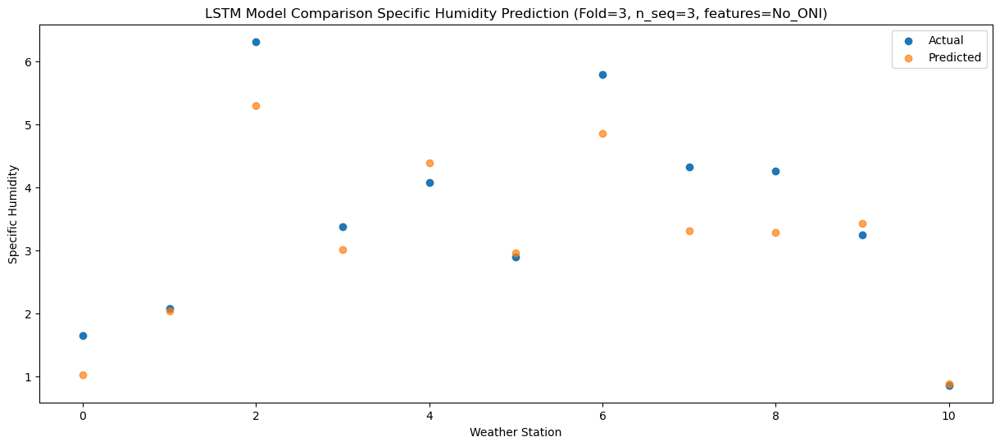

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    3.30   2.413163
1                 1    4.59   3.609265
2                 2    6.39   6.675976
3                 3    4.67   4.461219
4                 4    6.56   5.925319
5                 5    4.93   4.503981
6                 6    6.10   6.306028
7                 7    4.62   4.689531
8                 8    3.90   4.558598
9                 9    4.02   4.656608
10               10    2.14   2.125534


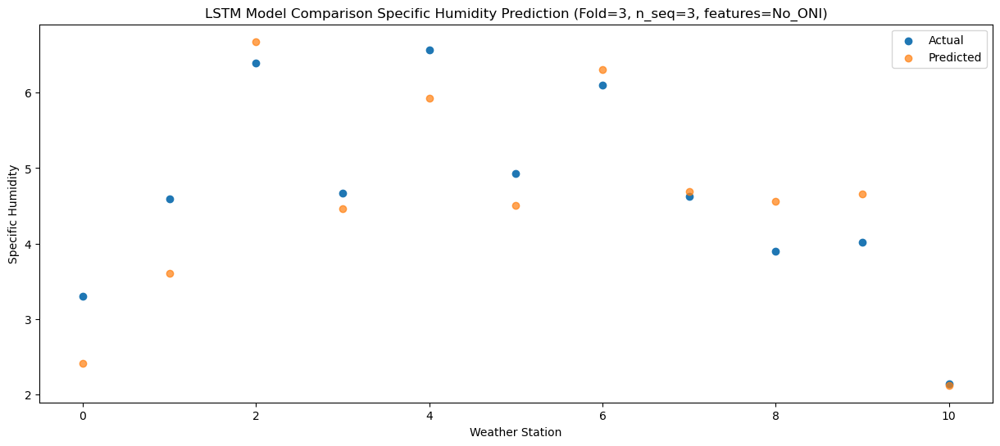

Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_16 (LSTM)              (1, 1, 1024)              12263424  
                                                                 
 dropout_16 (Dropout)        (1, 1, 1024)              0         
                                                                 
 lstm_17 (LSTM)              (1, 1024)                 8392704   
                                                                 
 dropout_17 (Dropout)        (1, 1024)                 0         
                                                                 
 dense_24 (Dense)            (1, 256)                  262400    
                                                                 
 dense_25 (Dense)            (1, 128)                  32896     
                                                                 
 dense_26 (Dense)            (1, 3)                   

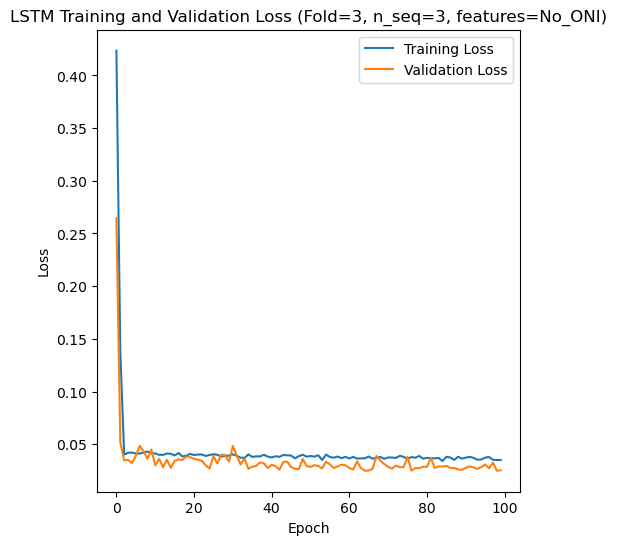

Epoch 1/100
84/84 [==============================] - 52s 210ms/step - loss: 0.4055 - accuracy: 0.5000 - mae: 0.4006 - rmse: 0.4055 - mape: 75.9950 - pearson: 0.4468 - val_loss: 0.2450 - val_accuracy: 0.0000e+00 - val_mae: 0.2360 - val_rmse: 0.2450 - val_mape: 44.5991 - val_pearson: 0.2522
Epoch 2/100
84/84 [==============================] - 12s 139ms/step - loss: 0.1135 - accuracy: 0.6310 - mae: 0.1038 - rmse: 0.1135 - mape: 19.2423 - pearson: 0.5528 - val_loss: 0.0350 - val_accuracy: 0.9000 - val_mae: 0.0302 - val_rmse: 0.0350 - val_mape: 5.7869 - val_pearson: 0.7496
Epoch 3/100
84/84 [==============================] - 11s 125ms/step - loss: 0.0427 - accuracy: 0.8690 - mae: 0.0369 - rmse: 0.0427 - mape: 6.9542 - pearson: 0.8131 - val_loss: 0.0327 - val_accuracy: 0.9000 - val_mae: 0.0267 - val_rmse: 0.0327 - val_mape: 5.0121 - val_pearson: 0.7428
Epoch 4/100
84/84 [==============================] - 10s 118ms/step - loss: 0.0416 - accuracy: 0.8690 - mae: 0.0356 - rmse: 0.0416 - mape: 6.

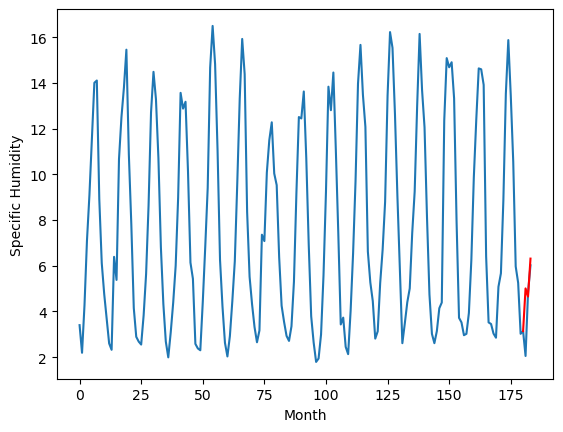

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.27		3.74		-0.53
6.26		3.49		-2.77
6.23		5.13		-1.10
[180, 181, 182, 183]
[7.79, 3.739304436445236, 3.4861902129650115, 5.129625571966171]


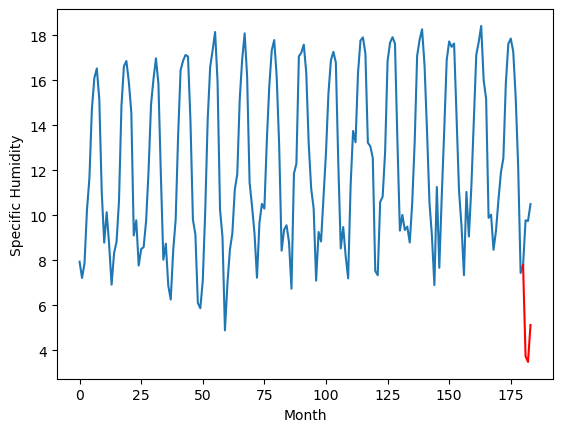

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.87		3.81		-0.06
3.75		3.61		-0.14
6.81		5.31		-1.50
[180, 181, 182, 183]
[5.03, 3.812532986998558, 3.6135791647434234, 5.312547813653946]


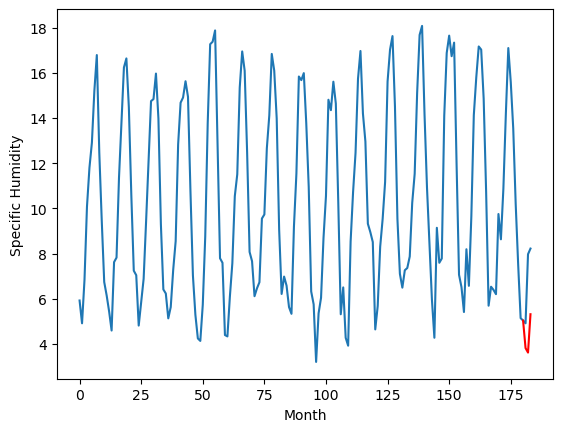

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.73		3.69		-0.04
3.41		3.46		0.05
6.07		5.20		-0.87
[180, 181, 182, 183]
[4.41, 3.6853922271728514, 3.4627738708257674, 5.19680590569973]


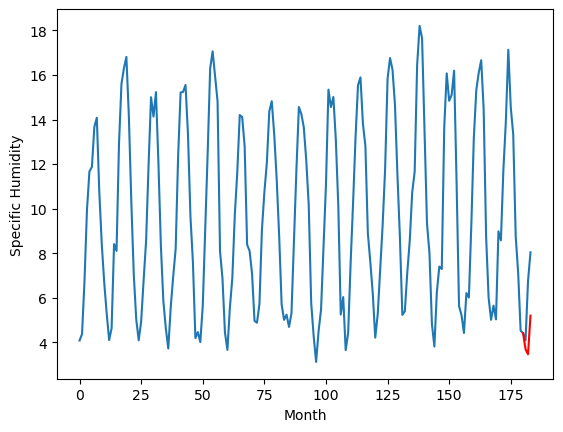

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.36		3.25		-0.11
2.91		3.00		0.09
5.49		4.74		-0.75
[180, 181, 182, 183]
[4.29, 3.2470551073551177, 2.9989662557840346, 4.744093218445778]


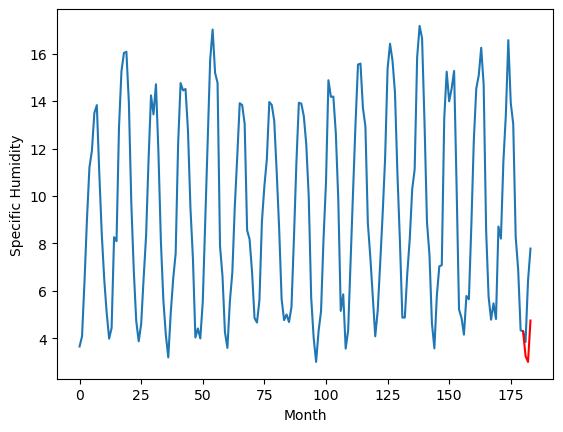

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
8.64		7.79		-0.85
8.00		7.50		-0.50
9.49		9.20		-0.29
[180, 181, 182, 183]
[3.47, 7.785465704798699, 7.5028369301557545, 9.200895773768426]


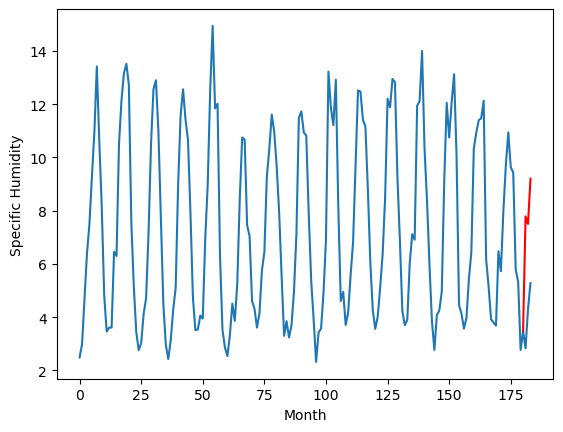

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.80		5.74		-0.06
6.05		5.54		-0.51
7.76		7.26		-0.50
[180, 181, 182, 183]
[4.52, 5.735429076552391, 5.539285702705383, 7.26407913684845]


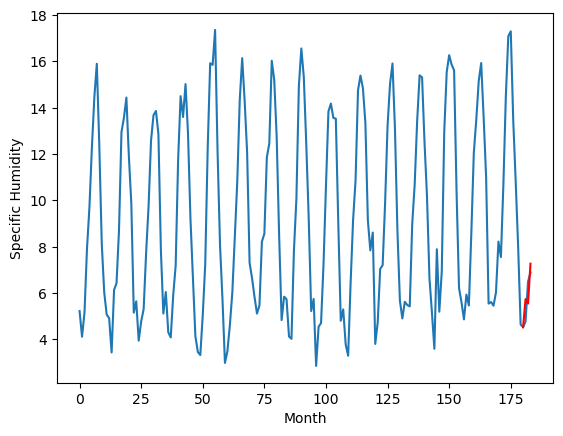

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.93		3.92		-0.01
3.30		3.69		0.39
5.67		5.47		-0.20
[180, 181, 182, 183]
[3.4, 3.9203876572847367, 3.694781439304352, 5.4672403502464295]


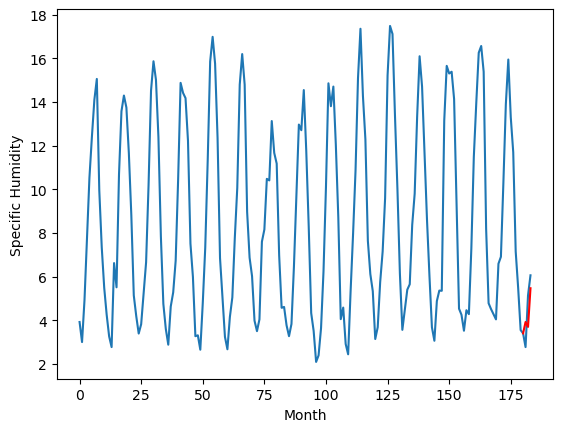

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.30		3.43		0.13
2.73		3.16		0.43
4.67		4.90		0.23
[180, 181, 182, 183]
[2.82, 3.434151569008827, 3.1567497342824935, 4.902655848860741]


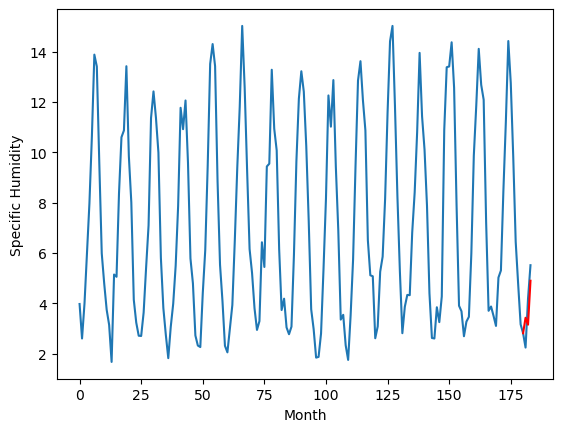

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.17		2.27		0.10
1.53		1.98		0.45
3.90		3.75		-0.15
[180, 181, 182, 183]
[2.86, 2.2678616547584536, 1.975164284706116, 3.745776643753052]


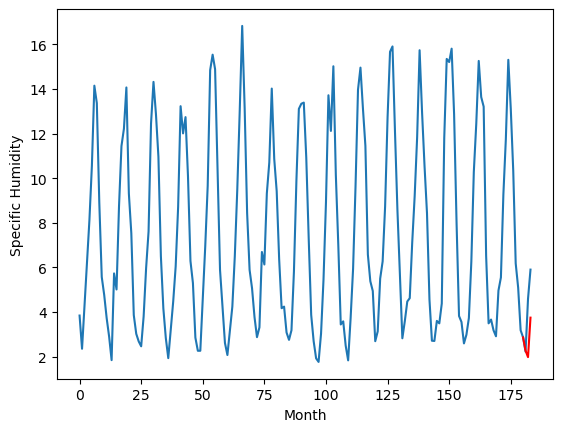

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.84		4.93		0.09
4.27		4.59		0.32
5.56		6.29		0.73
[180, 181, 182, 183]
[2.61, 4.932017655372619, 4.594452650547027, 6.291662724018097]


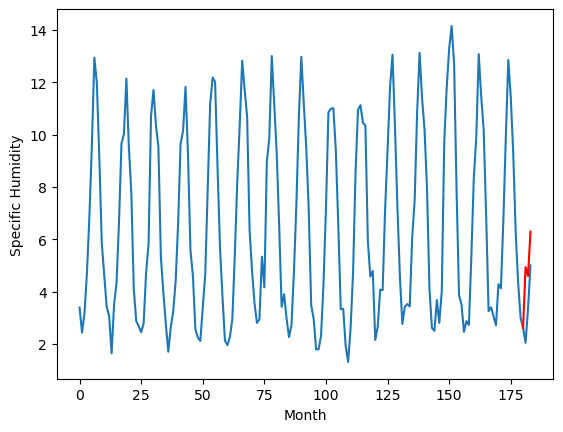

RangeIndex(start=1, stop=12, step=1)
[5.34, 4.269999999999999, 3.870000000000001, 3.7300000000000004, 3.3600000000000003, 8.64, 5.8, 3.93, 3.3000000000000003, 2.1699999999999995, 4.839999999999999]
[5.00866308927536, 3.739304436445236, 3.812532986998558, 3.6853922271728514, 3.2470551073551177, 7.785465704798699, 5.735429076552391, 3.9203876572847367, 3.434151569008827, 2.2678616547584536, 4.932017655372619]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    5.34   5.008663
1                 1    4.27   3.739304
2                 2    3.87   3.812533
3                 3    3.73   3.685392
4                 4    3.36   3.247055
5                 5    8.64   7.785466
6                 6    5.80   5.735429
7                 7    3.93   3.920388
8                 8    3.30   3.434152
9                 9    2.17   2.267862
10               10    4.84   4.932018


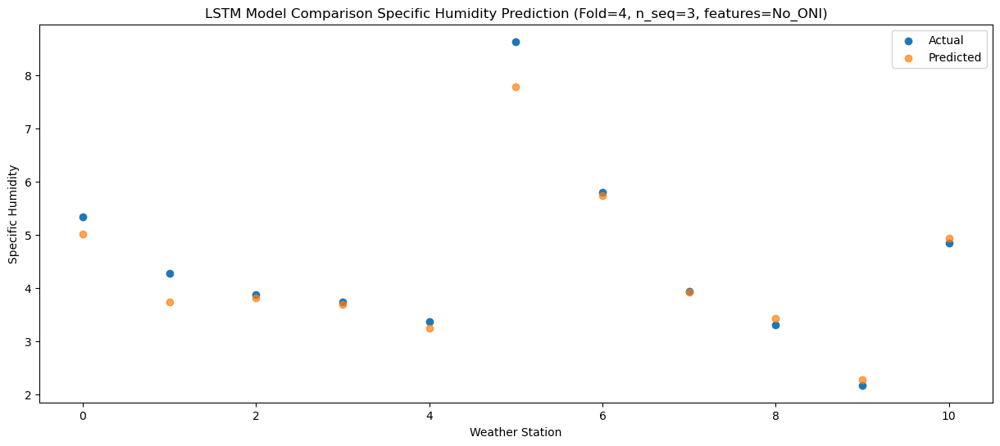

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    4.25   4.650197
1                 1    6.26   3.486190
2                 2    3.75   3.613579
3                 3    3.41   3.462774
4                 4    2.91   2.998966
5                 5    8.00   7.502837
6                 6    6.05   5.539286
7                 7    3.30   3.694781
8                 8    2.73   3.156750
9                 9    1.53   1.975164
10               10    4.27   4.594453


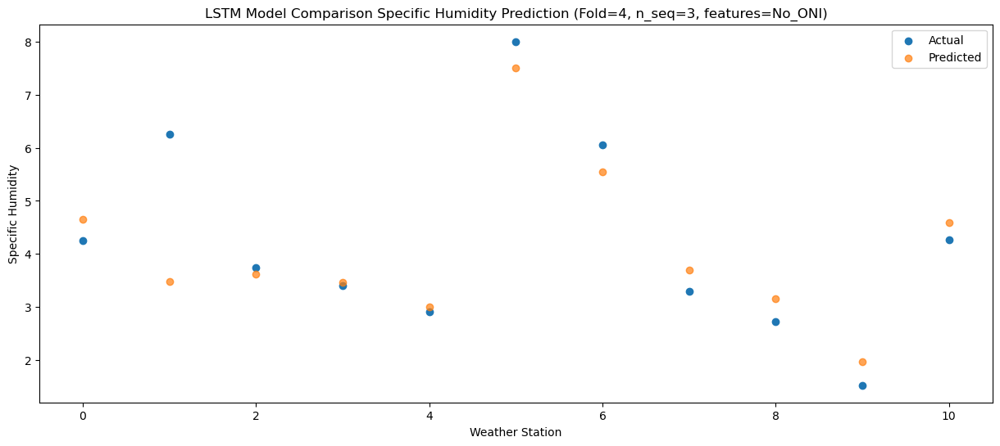

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    7.01   6.313189
1                 1    6.23   5.129626
2                 2    6.81   5.312548
3                 3    6.07   5.196806
4                 4    5.49   4.744093
5                 5    9.49   9.200896
6                 6    7.76   7.264079
7                 7    5.67   5.467240
8                 8    4.67   4.902656
9                 9    3.90   3.745777
10               10    5.56   6.291663


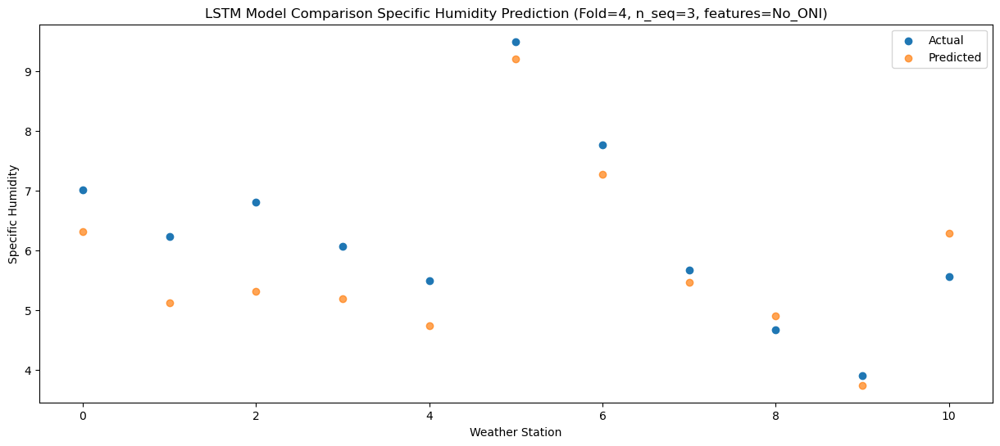

Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_18 (LSTM)              (1, 1, 1024)              12263424  
                                                                 
 dropout_18 (Dropout)        (1, 1, 1024)              0         
                                                                 
 lstm_19 (LSTM)              (1, 1024)                 8392704   
                                                                 
 dropout_19 (Dropout)        (1, 1024)                 0         
                                                                 
 dense_27 (Dense)            (1, 256)                  262400    
                                                                 
 dense_28 (Dense)            (1, 128)                  32896     
                                                                 
 dense_29 (Dense)            (1, 3)                   

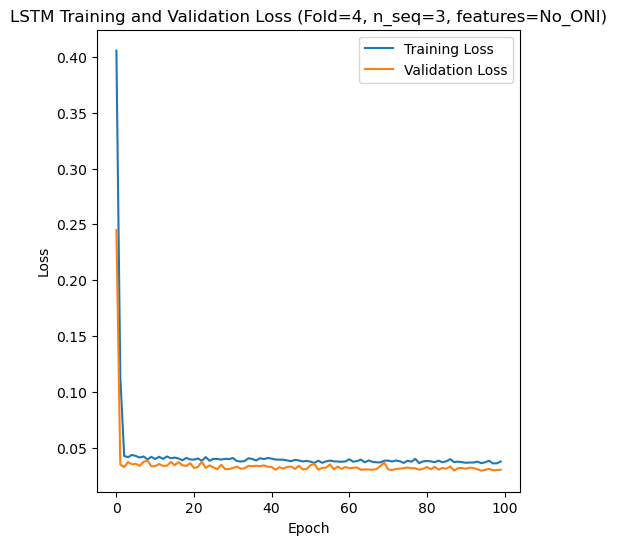

[[0.3548346326033202, 0.5567752406022968, 0.8974463235481738], [0.3743584743269983, 0.4318693668584541, 0.770653713873056], [0.43620431655480235, 0.9876050512706857, 1.0098857652285482], [0.5358015418510493, 0.6389021371170622, 0.5514045439035686], [0.32752546717665276, 0.9061856863198677, 0.7532626844724689]]
[[0.3199034761231054, 0.4390489909256042, 0.7355150280147789], [0.2944005867567933, 0.3481491470607846, 0.663697309385647], [0.3252671784128654, 0.6548079591955652, 0.8384952368756585], [0.40468621302734714, 0.5014293682033364, 0.4552963711456817], [0.21180005393245024, 0.5501084398139606, 0.6381877334551378]]
[[0.05830983596510773, 0.09285711184091076, 0.10234784407203214], [0.07136409918625536, 0.07615114768689035, 0.10278020478116069], [0.07252434627082333, 0.1413573974365615, 0.1468376992540693], [0.12031263290821849, 0.13345695071602995, 0.10344064302007458], [0.04218186923763803, 0.1281039797829135, 0.10242976452462128]]
[[0.8852204937809444, 0.819839373002412, 0.2611052771

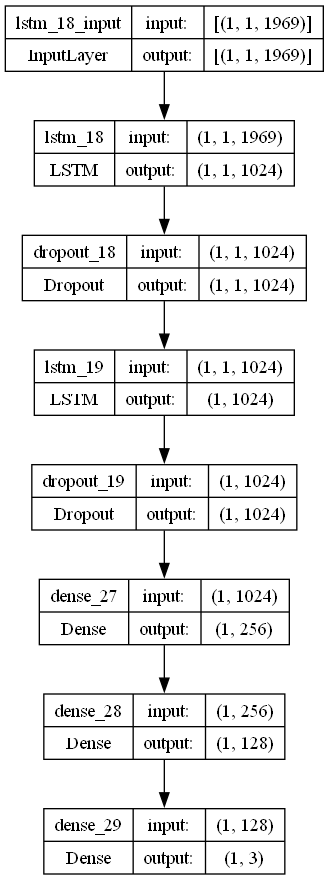

In [5]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from tensorflow.keras.utils import plot_model

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

# fit the best LSTM model using parameters found by Optuna
def create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch):
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters from the best model
    lr = 0.0016633295660330636
    optimizer = SGD(learning_rate = lr)
    activation_function = 'relu'
    lstm_units = 1024
    dropout_rate = 0.10094815217775135

    # design network
    model = Sequential()
    model.add(LSTM(lstm_units, return_sequences=True, batch_input_shape=(n_batch, X.shape[1], X.shape[2]), stateful=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer, metrics=['accuracy', 'mae', rmse, mape, pearson])
        
    return model

# Make one forecast with an LSTM
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_lstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# Evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_lstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# Invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # Invert the first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # Propagate the difference forecast using the inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# Inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # Create an array from the forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i - 1
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(test, forecasts, n_lag, n_seq):
    rmse_list = []
    mae_list = []
    mape_list = []
    r2_list = []
    for i in range(n_seq):
        actual = [row[i] for row in test]
        predicted = [forecast[i] for forecast in forecasts]
        rmse = sqrt(mean_squared_error(actual, predicted))
        mae = mean_absolute_error(actual, predicted)
        mse = mean_squared_error(actual, predicted)
        mape = mean_absolute_percentage_error(actual, predicted)
        r2 = r2_score(actual, predicted) 
        rmse_list.append(rmse)
        mae_list.append(mae)
        mape_list.append(mape)
        r2_list.append(r2)
        print("Month at t+"+str(i+1)+":")
        print('t+%d RMSE: %f' % ((i+1), rmse))
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d MAPE: %f' % ((i+1), mape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))

    return rmse_list, mae_list, mape_list, r2_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, n_test, n_seq, n_lag):
    # plot the entire dataset in blue
    plt.plot(series[:n_lag+2+len(forecasts)].values)
    # plot the forecasts in red
    off_s = n_lag + 1
    off_e = off_s + len(forecasts) + 1
    xaxis = [x for x in range(off_s, off_e)]
    yaxis = [series.values[off_s]] + forecasts
    print(xaxis)
    print(yaxis)
    plt.plot(xaxis, yaxis, color='red')
    plt.xlabel("Month")
    plt.ylabel("Specific Humidity")
    # show the plot
    plt.show()

n_batch = 1
n_test = 11
nb_epoch = 100
    
rmse_avg_list = []
mae_avg_list = []
mape_avg_list = []
r2_score_avg_list = []
forecast_results = []
actual_results = []
    
for i in range(5):
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X = train1[:, 0:-n_seq]
    y = train1[:, -n_seq:]
    X_test = test1[:, 0:-n_seq]
    y_test = test1[:, -n_seq:]
    X_val = validation1[:, 0:-n_seq]
    y_val = validation1[:, -n_seq:]

    dataset_df = pd.DataFrame(val_y[i])
    dataset_df = dataset_df.iloc[0:10, :]
    dataset = dataset_df.values

    series = pd.Series(dataset[:, 0]) # Using first column (specific humidity)

    X = X.reshape(X.shape[0], 1, X.shape[1])
    X1 = X_test
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch)
    history = best_model.fit(X, y, epochs=100, batch_size=n_batch, validation_data=(X_val, y_val))

    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test+2, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test+2, n_seq)

    rmse_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores root mean squared errors for each future time prediction
    mape_list = [] # list stores root mean squared errors for each future time prediction
    r2_list = [] # list stores root mean squared errors for each future time prediction

    # evaluate forecasts
    rmse_list, mae_list, mape_list, r2_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    rmse_avg_list.append(rmse_list)
    mae_avg_list.append(mae_list)
    mape_avg_list.append(mape_list)
    r2_score_avg_list.append(r2_list)
    forecast_results.append(forecasts)
    actual_results.append(actual)

    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual S.H.\tPredicted S.H.\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")
    
        # plot forecasts
        dataset_df = pd.DataFrame(val_y[i])
        dataset_df = dataset_df.iloc[0:11, :]
        dataset_df = dataset_df.transpose()
        dataset = dataset_df.values

        series_ws = pd.Series(dataset[:, j]) # Using first column (temperatures)
        forecasts_ws = forecasts[j]
        
        plot_forecasts(series_ws, forecasts_ws, n_test, n_seq, n_lag)

    # Print out plots of actual and predicted values for weather stations
    ws = df.index[1:12]
    print(ws)
    a = []
    f = []
    for q in range(len(actual)):
        x = actual[q]
        a.append(x[0])
    for q in range(len(forecasts)):
        x = forecasts[q]
        f.append(x[0])
    print(a)
    print(f)
    # Create a DataFrame for plotting
    results_df = pd.DataFrame({
        'ws': ws,
        'Actual': a,
        'Predicted': f
    })

    for k in range(n_seq):
        print("Predictions for (t+"+str(k)+"):")
        # Print out plots of actual and predicted values for each weather station
        results = []

        # Create a DataFrame for plotting
        for j in range(11):
            results.append([j, actual[j][k], forecasts[j][k]])
               
        results_df = pd.DataFrame(results)
        results_df.columns = ['Weather_Station', 'Actual', 'Predicted']

        print(results_df)
            
        # Plotting the results
        plt.figure(figsize=(15, 6))
        plt.scatter(results_df['Weather_Station'], results_df['Actual'], label='Actual')
        plt.scatter(results_df['Weather_Station'], results_df['Predicted'], label='Predicted', alpha=0.7)
        title1='LSTM Model Comparison Specific Humidity Prediction (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No_ONI)'
        plt.title(title1)
        plt.xlabel('Weather Station')
        plt.ylabel('Specific Humidity')
        plt.legend()
        plt.show()

    best_model.summary()

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title2 = 'LSTM Training and Validation Loss (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No_ONI)'
    plt.title(title2)
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(loc='upper right')
    plt.show()

print(rmse_avg_list)
print(mae_avg_list)
print(mape_avg_list)
print(r2_score_avg_list)
print(forecast_results)
print(actual_results)
print("Accuracy Results:")
print("RMSE for each fold:")
print(rmse_avg_list)
print("Average RMSE:"+str(np.mean(rmse_avg_list)))
print("Average MAE:"+str(np.mean(mae_avg_list)))
print("Average MAPE:"+str(np.mean(mape_avg_list)))
print("Average R2 Score:"+str(np.mean(r2_score_avg_list)))

# Plot model architecture
filename = "lstm_model_optimized_SH_S3_No_ONI.png"
plot_model(best_model, to_file=filename, show_shapes=True, show_layer_names=True)